# Taller 1: Introducción a Python para modelación hidrológica

**ICYA 4710 · Modelación de Sistemas y Procesos Hidrológicos**
Segundo semestre de 2026 · Juan Sebastián Hernández S., Ph.D.

---

## De qué se trata este taller

En el tutorial de configuración usted configuró el entorno WSL, conda, VS Code, Git y SPOTPY.
Hoy lo vamos a usar. La idea no es aprender Python en abstracto, sino aprender **el Python que se
necesita para recorrer el protocolo de modelación** que vimos en clase.

Cada parte del taller corresponde a una caja del protocolo:

| Parte del taller | Caja del protocolo | Minutos |
|---|---|---|
| 0. Verificación del entorno | — | 10 |
| 1. Python en 30 minutos | — | 30 |
| 2. Obtener y evaluar los datos | *Obtener datos medidos* · *Evaluar datos y necesidades de datos* | 20 |
| 3. HYMOD: del modelo conceptual al código | *Conceptualizar el modelo* · *Seleccionar o desarrollar el código* | 15 |
| 4. Criterios de desempeño | *Determinar criterios de desempeño aceptable* | 18 |
| 5. Calibración por ensayo y error | *Estimación de parámetros* | 12 |
| 6. Tres cuencas colombianas | *vuelta al inicio: propósito y datos* | 15 |

**Todo el código de este cuaderno ya está escrito y funciona.** Su trabajo no es programar, sino
**decidir**, **ejecutar**, **mirar el resultado** e **interpretarlo**. Las celdas marcadas con ✏️ son las que usted debe completar o responder.

---

## Qué se entrega

1. Este cuaderno completo, **corrido de arriba a abajo sin errores**, con las celdas ✏️ resueltas
   (6 de código y 10 de respuesta escrita).
2. Publicado en un repositorio propio de GitHub (las instrucciones están al final).

**Fecha límite:** Lunes 31 de agosto de 2026, 23:59. La rúbrica está en el enunciado del taller.

---

## Regla de oro del taller

> Un modelo que reproduce bien los caudales observados **no es necesariamente un buen modelo**.
> Puede estar dando las respuestas correctas con los argumentos equivocados. Buena parte de lo que
> haremos hoy consiste en aprender a desconfiar de un hidrograma que aparenta ser correcto.

---
# Parte 0 · Verificación del *environment*

Antes de empezar, confirme que el entorno que armó en el tutorial está activo.

**Antes de correr la celda siguiente**, revise la esquina superior derecha de VS Code, donde el kernel debe
decir `hidro` (o el nombre del environment que usted creó). Si dice `base` o `Python 3.x`, cámbielo con
`Ctrl + Shift + P` → `Notebook: Select Notebook Kernel`.

In [5]:
# --- Celda de verificación: si esto corre, el entorno esta bien ---
import sys, platform
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt

print("Python     :", sys.version.split()[0])
print("Ejecutable :", sys.executable)
print("numpy      :", np.__version__)
print("pandas     :", pd.__version__)
print("matplotlib :", matplotlib.__version__)
print("Sistema    :", platform.system(), platform.release())

# Los datos se encuentran en la carpeta 'datos/' del repositorio, un nivel arriba de 'notebooks/'
DATOS = Path("..") / "datos"
if not DATOS.exists():
    DATOS = Path("datos")          # por si abre el cuaderno desde la raiz del repositorio

archivos = sorted(p.name for p in DATOS.glob("*.csv"))
print("\nCarpeta de datos:", DATOS.resolve())
print("Archivos encontrados:", archivos)

assert "hymod_input.csv" in archivos, "No encuentro hymod_input.csv. Revise la ruta DATOS."
print("\nTodo listo.")

Python     : 3.12.14
Ejecutable : c:\Users\Equipo\miniconda3\envs\hidro\python.exe
numpy      : 2.5.2
pandas     : 3.0.5
matplotlib : 3.11.1
Sistema    : Windows 10

Carpeta de datos: C:\Users\Equipo\Desktop\python\taller1-hidrologia-main\datos
Archivos encontrados: ['cuenca_andina_21167080.csv', 'cuenca_caribe_28037030.csv', 'cuenca_llanos_35127020.csv', 'hymod_input.csv']

Todo listo.


**Si el `Ejecutable` no contiene `envs/hidro`**, el kernel está apuntando al Python equivocado.
Vuelva a la sección 4.4 del tutorial. Si `assert` falla, revise que clonó el repositorio completo
del taller y que está abriendo el cuaderno desde `notebooks/`.

Una última línea de configuración, para que todas las gráficas del taller sean legibles:

In [6]:
plt.rcParams.update({
    "figure.figsize": (10, 4),
    "figure.dpi": 600,
    "axes.grid": True,
    "grid.alpha": 0.3,
    "font.size": 10,
})

---
# Parte 1: Python en 30 minutos

Todo lo que sigue lo va a necesitar en las Partes 2 a 6. No hay nada aquí que no reaparezca después.

## 1.1 Variables y tipos

Una variable es un nombre que apunta a un valor. Python deduce el tipo por sí mismo.

In [7]:
area = 446.82            # km2          -> float (número decimal)
n_años = 8               # años         -> int   (número entero)
estacion = "21167080"    # código IDEAM -> str   (texto)
calibrada = False        #              -> bool  (verdadero / falso)

for v in (area, n_años, estacion, calibrada):
    print(f"{str(v):>10}  ->  {type(v).__name__}")

    446.82  ->  float
         8  ->  int
  21167080  ->  str
     False  ->  bool


**Nota:** el nombre de la variable es para las personas, no para el computador. `area` se entiende;
`a1` no lo hace. En un script de modelación con veinte parámetros, esa diferencia puede volver ininteligible su código.

## 1.2 Texto y f-strings

Las *f-strings* arman texto mezclando variables. Son la forma más limpia de imprimir resultados.

In [8]:
caudal_medio = 19.9054321      # m3/s

print(f"Estacion {estacion}: area = {area} km2")
print(f"Caudal medio = {caudal_medio} m3/s")          # ilegible
print(f"Caudal medio = {caudal_medio:.2f} m3/s")      # 2 decimales
print(f"Caudal medio = {caudal_medio:8.2f} m3/s")     # 2 decimales, ancho 8
print(f"Rendimiento  = {caudal_medio/area*1000:.2f} L/s/km2")

Estacion 21167080: area = 446.82 km2
Caudal medio = 19.9054321 m3/s
Caudal medio = 19.91 m3/s
Caudal medio =    19.91 m3/s
Rendimiento  = 44.55 L/s/km2


## 1.3 Listas, y por qué vamos a usar `numpy`

Una **lista** guarda elementos en orden. Sirve para todo, pero no sirve para hacer operaciones aritméticas o cálculos más avanzados de manera sencilla o directa.

In [9]:
# Precipitación diaria de una semana (mm)
p = [0.0, 12.4, 3.1, 0.0, 0.0, 28.7, 5.2]

print("elementos      :", len(p))
print("primer día     :", p[0])        # Python empieza a contar en 0
print("último día     :", p[-1])       # los índices negativos cuentan desde el final
print("días 2 a 4     :", p[1:4])      # el límite superior NO se incluye
print("lista + lista  :", p + [1.0])   # el signo + CONCATENA, no suma

elementos      : 7
primer día     : 0.0
último día     : 5.2
días 2 a 4     : [12.4, 3.1, 0.0]
lista + lista  : [0.0, 12.4, 3.1, 0.0, 0.0, 28.7, 5.2, 1.0]


In [10]:
# Con numpy, el mismo signo + hace aritmética elemento a elemento
P = np.array(p)

print("P            :", P)
print("P * 2        :", P * 2)
print("P acumulada  :", P.cumsum())
print(f"total  = {P.sum():.1f} mm")
print(f"media  = {P.mean():.2f} mm/día")
print(f"máximo = {P.max():.1f} mm  (día {P.argmax() + 1})")

P            : [ 0.  12.4  3.1  0.   0.  28.7  5.2]
P * 2        : [ 0.  24.8  6.2  0.   0.  57.4 10.4]
P acumulada  : [ 0.  12.4 15.5 15.5 15.5 44.2 49.4]
total  = 49.4 mm
media  = 7.06 mm/día
máximo = 28.7 mm  (día 6)


**Regla práctica:** listas para colecciones de elementos heterogéneos (nombres de archivos, rutas,
etiquetas); `numpy` para series numéricas. Una serie de 30 años de caudal diario son 10 957 números.
`numpy` la procesa en milisegundos, una lista de Python no.

Un recurso que va a usar todo el tiempo son las **máscaras booleanas**.

In [11]:
mascara = P > 0                      # array de True/False, del mismo tamaño
print("máscara       :", mascara)
print("días con lluvia:", mascara.sum())          # True cuenta como 1
print("valores        :", P[mascara])             # filtra el array
print(f"lluvia media en días húmedos: {P[mascara].mean():.2f} mm")

máscara       : [False  True  True False False  True  True]
días con lluvia: 4
valores        : [12.4  3.1 28.7  5.2]
lluvia media en días húmedos: 12.35 mm


## 1.4 Control de flujo: `for` e `if`

Un `for` repite mientras que un `if` decide. Usarlos conjuntamente es casi toda la programación que necesita un modelo conceptual.

In [12]:
for i, lluvia in enumerate(P):
    if lluvia == 0:
        clase = "seco"
    elif lluvia < 10:
        clase = "lluvia débil"
    else:
        clase = "lluvia fuerte"
    print(f"día {i + 1}:  {lluvia:5.1f} mm   {clase}")

día 1:    0.0 mm   seco
día 2:   12.4 mm   lluvia fuerte
día 3:    3.1 mm   lluvia débil
día 4:    0.0 mm   seco
día 5:    0.0 mm   seco
día 6:   28.7 mm   lluvia fuerte
día 7:    5.2 mm   lluvia débil


**Atención a la indentación.** En Python los bloques se definen con espacios, no con llaves.
Las cuatro líneas dentro del `for` están indentadas cuatro espacios. Si desalinea una, el programa
cambia de significado o falla.

## 1.5 Funciones

Una función empaqueta un cálculo con un nombre. A continuación, un par de funciones para convertir caudales en escorrentía, y vice versa:

In [13]:
def m3s_a_mm(Q_m3s, area_km2):
    """Convierte un caudal [m3/s] a lámina de agua diaria [mm/día].

    Un caudal de 1 m3/s durante un día son 86400 m3 de agua. Repartidos sobre
    el área de la cuenca (en m2) dan una altura en metros, que pasamos a mm.
    """
    return Q_m3s * 86400.0 / (area_km2 * 1e6) * 1000.0


def mm_a_m3s(Q_mm, area_km2):
    """Operacion inversa de m3s_a_mm."""
    return Q_mm * (area_km2 * 1e6) / 1000.0 / 86400.0


q_mm = m3s_a_mm(caudal_medio, area)
print(f"{caudal_medio:.2f} m3/s en {area} km2  =  {q_mm:.3f} mm/día")
print(f"y de vuelta: {mm_a_m3s(q_mm, area):.2f} m3/s")

19.91 m3/s en 446.82 km2  =  3.849 mm/día
y de vuelta: 19.91 m3/s


**Por qué importa esta conversión:** los modelos conceptuales de lluvia-escorrentía trabajan en
**láminas de agua** (mm), porque así la precipitación, la evapotranspiración y el caudal son comparables y el
balance hídrico cierra sumando y restando. Los caudales observados vienen en **m³/s**. Convertir mal
las unidades es, con diferencia, el error más frecuente al montar un modelo.

## 1.6 Cuando algo falla, cómo leer el error

En clase van a aparecer errores. Todos. La habilidad que sí importa es leer la última línea del
mensaje. Estos son los cuatro que va a ver hoy:

In [14]:
ejemplos = [
    ("NameError",         lambda: precipitacion_total),      # la variable no existe (o la escribio mal)
    ("TypeError",         lambda: "3" + 3),                  # mezcló texto con número
    ("IndexError",        lambda: p[99]),                    # pidió la posición 99 de una lista de 7
    ("ZeroDivisionError", lambda: 1 / 0),                    # división por cero
]

for nombre, f in ejemplos:
    try:
        f()
    except Exception as e:
        print(f"{nombre:18} -> {type(e).__name__}: {e}")

NameError          -> NameError: name 'precipitacion_total' is not defined
TypeError          -> TypeError: can only concatenate str (not "int") to str
IndexError         -> IndexError: list index out of range
ZeroDivisionError  -> ZeroDivisionError: division by zero


Y el quinto, que no se puede demostrar sin romper el notebook:

- **`ModuleNotFoundError: No module named 'xxx'`**: casi nunca es que el paquete no esté instalado.
  Es que está instalado en **otro** environment. Revise el kernel (esquina superior derecha) y
  ejecute `conda env list` en la terminal, donde el `*` señala el environment activo.

**Regla:** cuando algo falle, lea la **última** línea del mensaje primero, y después mire el número de
línea que le señala. No borre y reescriba a ciegas.

## 1.7 `pandas`: las tablas/bases de datos con las que vamos a trabajar

`pandas` es `numpy` con etiquetas. Un `DataFrame` es una tabla mientras que un `Series` es una columna. Lo que lo
hace muy útil en hidrología es que el índice puede ser una **fecha**.

In [15]:
demo = pd.DataFrame({
    "P_mm":  [0.0, 12.4, 3.1, 0.0, 0.0, 28.7, 5.2],
    "Q_m3s": [3.2,  3.4, 6.8, 5.1, 4.2,  4.8, 12.5],
}, index=pd.date_range("2001-04-01", periods=7, freq="D"))
demo.index.name = "fecha"

print(demo)
print("\nSolo la columna de caudal:")
print(demo["Q_m3s"])
print("\nUn día específico:")
print(demo.loc["2001-04-03"])

            P_mm  Q_m3s
fecha                  
2001-04-01   0.0    3.2
2001-04-02  12.4    3.4
2001-04-03   3.1    6.8
2001-04-04   0.0    5.1
2001-04-05   0.0    4.2
2001-04-06  28.7    4.8
2001-04-07   5.2   12.5

Solo la columna de caudal:
fecha
2001-04-01     3.2
2001-04-02     3.4
2001-04-03     6.8
2001-04-04     5.1
2001-04-05     4.2
2001-04-06     4.8
2001-04-07    12.5
Freq: D, Name: Q_m3s, dtype: float64

Un día específico:
P_mm     3.1
Q_m3s    6.8
Name: 2001-04-03 00:00:00, dtype: float64


In [16]:
# Crear columnas nuevas es una línea
demo["Q_mm"] = m3s_a_mm(demo["Q_m3s"], area)
demo["mes"]  = demo.index.month

print(demo.round(3))
print("\nEstadisticos de la tabla:")
print(demo[["P_mm", "Q_mm"]].describe().round(3))

            P_mm  Q_m3s   Q_mm  mes
fecha                              
2001-04-01   0.0    3.2  0.619    4
2001-04-02  12.4    3.4  0.657    4
2001-04-03   3.1    6.8  1.315    4
2001-04-04   0.0    5.1  0.986    4
2001-04-05   0.0    4.2  0.812    4
2001-04-06  28.7    4.8  0.928    4
2001-04-07   5.2   12.5  2.417    4

Estadisticos de la tabla:
         P_mm   Q_mm
count   7.000  7.000
mean    7.057  1.105
std    10.532  0.624
min     0.000  0.619
25%     0.000  0.735
50%     3.100  0.928
75%     8.800  1.151
max    28.700  2.417


---
## ✏️ Ejercicio 1

**1a.** Complete la función `coef_escorrentia`, que recibe dos series (o arrays) de precipitación y
caudal **en las mismas unidades** y devuelve el coeficiente de escorrentía $C = \sum Q / \sum P$.
Es una sola línea.

In [17]:
def coef_escorrentia(P, Q):
    """Coeficiente de escorrentía: fracción de la lluvia que sale como caudal."""
    # ✏️ COMPLETE: devuelva la suma de Q dividida entre la suma de P
    return Q.sum()/P.sum()


# Verificación (no modifique): debe imprimir 0.4
prueba = coef_escorrentia(np.array([10.0, 20.0, 20.0]), np.array([4.0, 8.0, 8.0]))
print("C =", prueba)
assert prueba is not Ellipsis, "Todavía no completó la función: reemplace el '...' del return."
assert abs(prueba - 0.4) < 1e-9, f"La función devuelve {prueba}, pero debería devolver 0.4."
print("Correcto.")

C = 0.4
Correcto.


**1b.** El coeficiente de escorrentía que acaba de programar puede dar un valor **mayor que 1**
en una cuenca real. Escriba dos razones distintas por las que eso puede ocurrir. Piense en el
protocolo. Una razón debe ser física (algo que pasa en la cuenca) y la otra debe ser de datos.

> ✏️ **Respuesta 1b:**
> 1. *(Aporte de agua subterranea al caudal del flujo base, que aumenta el caudal observado sin corresponder directamente a la precipitacion del periodo analizado)*
> 2. *(No es preciso el ejercicio en decir si tenemos periodos iguales, tal ves se deba a desfase temporal entre registro de las variables)*

---
# Parte 2 · Obtener y evaluar los datos

> **Protocolo:** cajas *Obtener datos medidos de entrada y salida* y *Evaluar datos y necesidades de datos*.

Ninguna decisión de modelación se toma antes de mirar los datos. Esta parte es corta de código y larga
de criterio.

Vamos a trabajar con la cuenca de ejemplo que trae SPOTPY, una cuenca experimental de **1.783 km²**
con cinco años de datos diarios (2012–2016) de precipitación, evapotranspiración potencial (estimada
con la fórmula de Turc) y caudal.

## 2.1 Cargar la serie

In [18]:
AREA_HYMOD = 1.783        # km2

raw = pd.read_csv(
    DATOS / "hymod_input.csv",
    sep=";",                              # este archivo usa punto y coma
    parse_dates=["Date"],
    date_format="%d.%m.%Y",               # día.mes.año
)
raw.head()

,Date,rainfall[mm],TURC [mm d-1],Discharge[ls-1]
0,2012-01-01,2.052861,0.35,NaN
1,2012-01-02,0.000000,0.26,NaN
2,2012-01-03,0.584561,0.39,NaN
3,2012-01-04,0.123880,0.53,NaN
4,2012-01-05,0.000000,0.44,NaN


In [19]:
# Renombrar a algo manejable y poner la fecha como índice
df = raw.rename(columns={
    "Date": "fecha",
    "rainfall[mm]": "P_mm",
    "TURC [mm d-1]": "ET0_mm",
    "Discharge[ls-1]": "Q_ls",
}).set_index("fecha")

# Unidades: de L/s a m3/s, y de m3/s a lámina de agua (mm/día)
df["Q_m3s"] = df["Q_ls"] / 1000.0
df["Q_mm"]  = m3s_a_mm(df["Q_m3s"], AREA_HYMOD)
df = df[["P_mm", "ET0_mm", "Q_m3s", "Q_mm"]]

df.head()

,P_mm,ET0_mm,Q_m3s,Q_mm
fecha,,,,
2012-01-01,2.052861,0.35,NaN,NaN
2012-01-02,0.000000,0.26,NaN,NaN
2012-01-03,0.584561,0.39,NaN,NaN
2012-01-04,0.123880,0.53,NaN,NaN
2012-01-05,0.000000,0.44,NaN,NaN


## 2.2 Primera inspección

Tres comandos que se ejecutan **siempre**, antes de cualquier otra instrucción.

In [20]:
print(f"Período : {df.index.min().date()}  a  {df.index.max().date()}")
print(f"Registros: {len(df)}   (días esperados: {(df.index.max()-df.index.min()).days + 1})")
print()
df.info()

Período : 2012-01-01  a  2016-12-31
Registros: 1827   (días esperados: 1827)

<class 'pandas.DataFrame'>
DatetimeIndex: 1827 entries, 2012-01-01 to 2016-12-31
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   P_mm    1827 non-null   float64
 1   ET0_mm  1827 non-null   float64
 2   Q_m3s   1461 non-null   float64
 3   Q_mm    1461 non-null   float64
dtypes: float64(4)
memory usage: 71.4 KB


In [21]:
df.describe().round(3)

,P_mm,ET0_mm,Q_m3s,Q_mm
count,1827.000,1827.000,1461.000,1461.000
mean,1.460,1.597,0.009,0.456
std,3.394,1.449,0.013,0.640
min,0.000,0.000,0.000,0.001
25%,0.000,0.380,0.001,0.065
50%,0.101,1.200,0.004,0.209
75%,1.168,2.510,0.013,0.638
max,40.091,6.160,0.114,5.508


In [22]:
# Faltantes por año y por variable
faltantes = df.isna().groupby(df.index.year).sum()
faltantes["días"] = df.groupby(df.index.year).size()
faltantes

,P_mm,ET0_mm,Q_m3s,Q_mm,días
fecha,,,,,
2012,0,0,366,366,366
2013,0,0,0,0,365
2014,0,0,0,0,365
2015,0,0,0,0,365
2016,0,0,0,0,366


**Lea esa tabla antes de seguir.** Toda la serie de caudal de 2012 está vacía, porque en esta cuenca el aforo empezó en 2013. Es decir, el primer año **solo** sirve como período
de calentamiento (que es exactamente lo que necesitamos).

Pero ese hueco trae consigo una trampa que debemos identificar desde ahora, porque va a reaparecer en
todas las partes siguientes.

> ### Regla de comparación
>
> `P` y `ET0` tienen 1827 días. `Q` observado tiene 1461. Si usted calcula
> `df["P_mm"].mean()` y `df["Q_mm"].mean()` y compara los dos números, **está comparando promedios
> tomados sobre períodos distintos**, porque `pandas` ignora los `NaN` en silencio, sin avisar. Lo mismo pasa
> con las sumas, con los balances hídricos y con cualquier razón entre dos series.
>
> La regla, entonces:
>
> - Cuando **describa una sola serie** (su climatología, su curva de duración, sus estadísticos),
>   use (en principio) todos los días disponibles de esa serie. Es posible que sea necesario un análisis estadístico preliminar para descartar valores anómalos, completar datos, entre otros.
> - Cuando **compare o combine dos o más series** (un balance, una razón, un sesgo, una función
>   objetivo), use **exactamente los mismos días en todas**.
>
La función siguiente hace cumplir la segunda regla, y la vamos a usar cada vez que comparemos algo.

In [23]:
def dias_comparables(datos, columnas, periodo=slice(None)):
    """Recorta a `periodo` y descarta los días en los que falte CUALQUIERA de `columnas`.

    Devuelve una tabla en la que todas las columnas pedidas están definidas en
    exactamente los mismos días, de modo que sus sumas, medias y razones sean
    comparables entre sí.
    """
    return datos.loc[periodo, columnas].dropna()


# Demostración de por qué importa
comunes = dias_comparables(df, ["P_mm", "Q_mm"])
print(f"P media sobre TODOS sus días          : {df['P_mm'].mean():.3f} mm/día  ({df['P_mm'].notna().sum()} días)")
print(f"P media sobre los días con Q observado: {comunes['P_mm'].mean():.3f} mm/día  ({len(comunes)} días)")
print()
print(f"Una diferencia de {abs(df['P_mm'].mean()-comunes['P_mm'].mean())/comunes['P_mm'].mean()*100:.1f} %")

P media sobre TODOS sus días          : 1.460 mm/día  (1827 días)
P media sobre los días con Q observado: 1.433 mm/día  (1461 días)

Una diferencia de 1.9 %


## 2.3 Balance hídrico anual

La primera prueba de credibilidad de un conjunto de datos no es estadística, es el balance hídrico. La
ecuación de conservación de la masa, considerando como entradas a la precipitación $P$, como salidas a la escorrentía $Q$ y la evapotranspiración real $ET$, y el almacenamiento de agua en la cuenca $S$, es la siguiente:

$$\frac{dS}{dt} = P - ET - Q \qquad \Longrightarrow \qquad ET = P - Q - \Delta S$$

De ahí sale la versión que usamos usualmente en condiciones de largo plazo, $ET \approx P - Q$, pero conviene tener presente que esa
versión **no es la ecuación, es la ecuación más un supuesto**: $\Delta S \approx 0$. Y ese supuesto
exige el cumplimiento simultáneo de cuatro condiciones: que el período sea suficientemente
largo, que la divisoria topográfica
coincida con la subterránea, que no haya captaciones ni transvases, y que `P` y `Q` estén bien medidos
sobre la misma área.

Por eso $P - Q$ no es necesariamente una estimación directa de la evapotranspiración, es un **residuo del balance**, y como todo
residuo absorbe los errores de todo lo demás. Sirve como cota y como detector de inconsistencias, ya que un
residuo negativo, o que se aproxime a la evapotranspiración (o demanda atmosférica) de referencia $ET_0$ en una cuenca con temporada seca marcada, señala que
alguno de los supuestos no se cumple. En la Parte 6 vamos a cuantificar qué tan
grande es ese error con algunas cuencas colombianas.

In [24]:
anual = df.resample("YS").sum(min_count=300)          # min_count: no sumar años incompletos
anual = anual[["P_mm", "ET0_mm", "Q_mm"]]
# Cuántos días de caudal observado sostienen cada fila: sin esta columna, la tabla
# invita a comparar años que no son comparables.
anual["dias_con_Q"] = df["Q_mm"].notna().resample("YS").sum()
anual["residuo_P_menos_Q"] = anual["P_mm"] - anual["Q_mm"]   # NO es la ET, es un residuo
anual["C_escorrentia"]   = anual["Q_mm"] / anual["P_mm"]
anual["residuo/ET0"]     = anual["residuo_P_menos_Q"] / anual["ET0_mm"]
anual.index = anual.index.year
anual = anual[["dias_con_Q", "P_mm", "ET0_mm", "Q_mm",
               "residuo_P_menos_Q", "C_escorrentia", "residuo/ET0"]]
anual.round(2)

,dias_con_Q,P_mm,ET0_mm,Q_mm,residuo_P_menos_Q,C_escorrentia,residuo/ET0
fecha,,,,,,,
2012,0,573.79,578.70,NaN,NaN,NaN,NaN
2013,365,573.93,547.38,223.28,350.66,0.39,0.64
2014,365,458.29,598.15,135.52,322.77,0.30,0.54
2015,365,519.23,621.58,146.34,372.89,0.28,0.60
2016,366,541.61,571.70,161.40,380.21,0.30,0.67


**Cómo se lee esta tabla:**

- La fila de **2012 aparece vacía** en todo lo que involucra el caudal, y así debe ser, porque sin `Q` no hay
  balance que cerrar. La columna `dias_con_Q` está ahí para que eso salte a la vista en lugar de
  esconderse detrás de un `NaN`.
- `C_escorrentia` es la fracción de la lluvia que sale por el río. Valores típicos: 0.2–0.4 en cuencas
  secas, 0.5–0.8 en cuencas húmedas de montaña.
- `residuo/ET0` compara el residuo del balance con la demanda atmosférica de referencia.
  **Si pasa de 1, los datos son internamente inconsistentes** y lo que hay que averiguar es cuál de los
  supuestos de arriba se rompió. Si se acerca mucho a 1 en una cuenca con una temporada seca marcada, la alerta es
  casi igual de fuerte, ya que significaría que la cuenca evapora al máximo posible todo el año, incluso sin
  agua disponible.

## 2.4 Hietograma e hidrograma

En hidrología esta figura se dibuja con la lluvia invertida desde el borde superior. La convención tiene una razón práctica, y es que permite asociar casi de inmediato cada evento de lluvia con la creciente que produce.

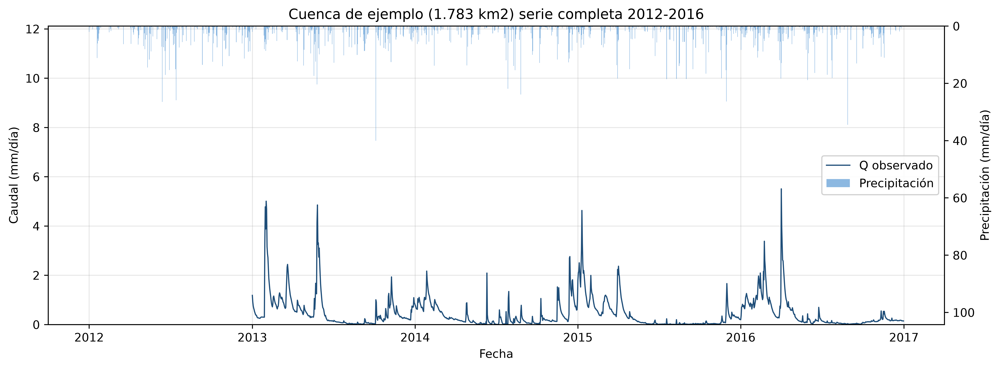

In [25]:
def hietograma_hidrograma(datos, titulo="", ax=None):
    """Gráfica caudal (abajo) y precipitación invertida (arriba) en el mismo eje temporal."""
    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 4.5))

    ax.plot(datos.index, datos["Q_mm"], color="#1f4e79", lw=1.0, label="Q observado")
    ax.set_ylabel("Caudal (mm/día)")
    ax.set_ylim(0, datos["Q_mm"].max() * 2.2)
    ax.set_xlabel("Fecha")

    axp = ax.twinx()
    axp.bar(datos.index, datos["P_mm"], width=1.0, color="#5b9bd5", alpha=0.7, label="Precipitación")
    axp.set_ylabel("Precipitación (mm/día)")
    axp.invert_yaxis()
    axp.set_ylim(datos["P_mm"].max() * 2.6, 0)
    axp.grid(False)

    h1, l1 = ax.get_legend_handles_labels()
    h2, l2 = axp.get_legend_handles_labels()
    ax.legend(h1 + h2, l1 + l2, loc="center right", framealpha=0.9)
    ax.set_title(titulo)
    return ax


hietograma_hidrograma(df, "Cuenca de ejemplo (1.783 km2) serie completa 2012-2016")
plt.tight_layout(); plt.show()

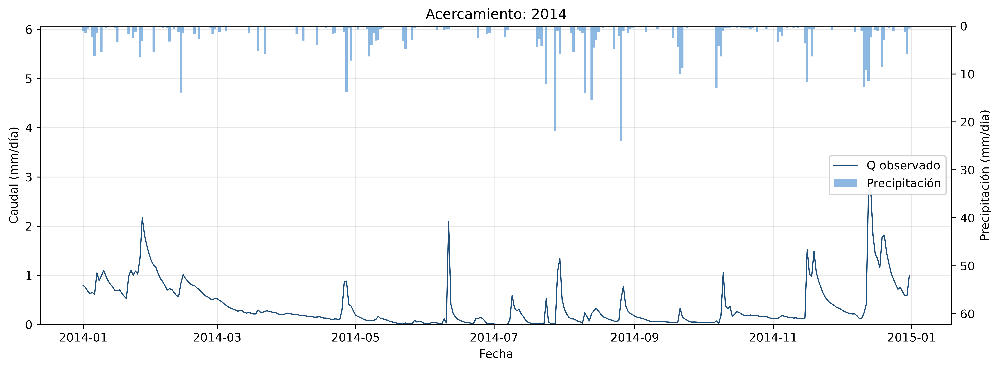

In [26]:
# Un acercamiento a un solo año deja ver la respuesta a eventos individuales
hietograma_hidrograma(df.loc["2014"], "Acercamiento: 2014")
plt.tight_layout(); plt.show()

## 2.5 Curva de duración de caudales

La curva de duración responde a la siguiente pregunta. *¿Qué porcentaje del tiempo es excedido un caudal dado?* Es una de las formas más compactas de describir el régimen de una cuenca y va a reaparecer en la Parte 4, cuando discutamos qué favorece cada función objetivo. Su principal limitación es que se pierden los componentes de ocurrencia y duración consecutiva de eventos de interés hidrológico.

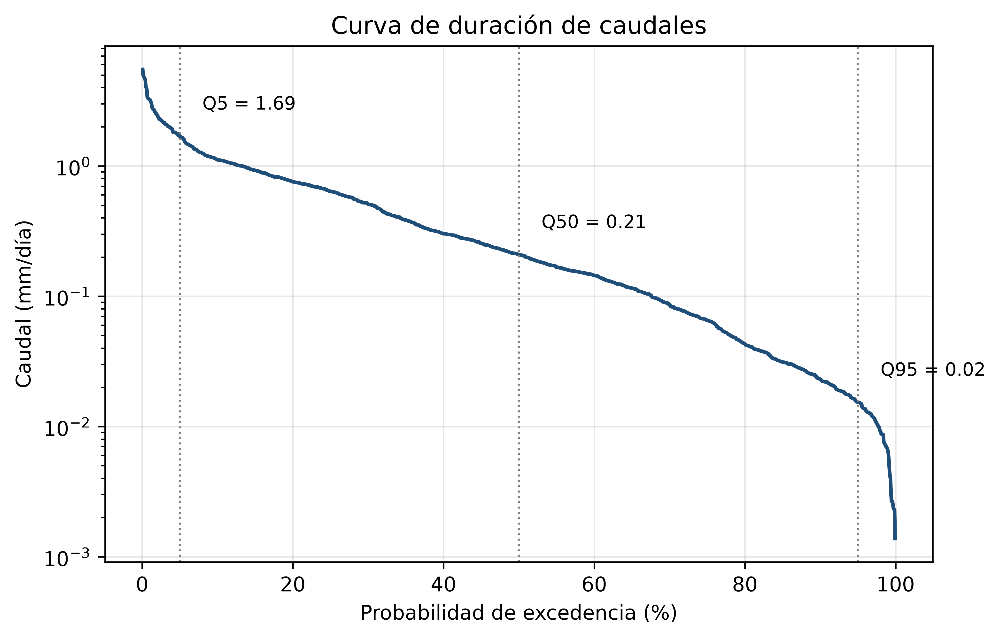

In [27]:
def curva_duracion(Q):
    """Devuelve (probabilidad de excedencia %, caudal ordenado de mayor a menor)."""
    q = np.sort(np.asarray(Q)[np.isfinite(Q)])[::-1]
    prob = np.arange(1, len(q) + 1) / (len(q) + 1) * 100
    return prob, q


prob, q = curva_duracion(df["Q_mm"])

fig, ax = plt.subplots(figsize=(7, 4.5))
ax.plot(prob, q, color="#1f4e79", lw=1.8)
ax.set_yscale("log")
ax.set_xlabel("Probabilidad de excedencia (%)")
ax.set_ylabel("Caudal (mm/día)")
ax.set_title("Curva de duración de caudales")
for p_ in (5, 50, 95):
    v = np.interp(p_, prob, q)
    ax.axvline(p_, color="grey", ls=":", lw=1)
    ax.annotate(f"Q{p_} = {v:.2f}", xy=(p_, v), xytext=(p_ + 3, v * 1.6), fontsize=9)
plt.tight_layout(); plt.show()

---
## ✏️ Ejercicio 2: Particionar la serie

Antes de calibrar un modelo, hay que decidir **qué parte de la serie se usa para qué**. El protocolo separa
explícitamente el *conjunto para estimación de parámetros* (CAL) del *conjunto para prueba de
aceptabilidad* (ACE), y además necesitamos un período de **calentamiento** para que la condición inicial
supuesta (todos los almacenamientos en cero) no influya sobre los resultados.

Complete las tres fechas abajo. Criterios que debe respetar:

- El calentamiento debe cubrir, como mínimo, el período **sin datos de caudal**.
- Los dos períodos restantes deben ser **disjuntos** y de longitud razonable.
- Los tres juntos deben cubrir toda la serie disponible.

**Justifique su partición en la celda de texto que sigue.** No hay una única respuesta correcta, pero
sí hay respuestas indefendibles.

In [28]:
# ✏️ COMPLETE las tres fechas (formato "AAAA-MM-DD")

FIN_CALENTAMIENTO   = "2012-12-31"     # último día que se descarta
INICIO_CALIBRACION  = "2013-01-01"     # primer día del conjunto de estimación de parámetros
INICIO_ACEPTABILIDAD = "2015-01-01"    # primer día del conjunto de prueba de aceptabilidad

# --- No modifique de aquí en adelante ---
for _nombre, _valor in [("FIN_CALENTAMIENTO", FIN_CALENTAMIENTO),
                        ("INICIO_CALIBRACION", INICIO_CALIBRACION),
                        ("INICIO_ACEPTABILIDAD", INICIO_ACEPTABILIDAD)]:
    assert _valor != "....", (
        f"Falta completar {_nombre}. Escriba una fecha en formato \"AAAA-MM-DD\" "
        "en las tres variables de arriba antes de correr esta celda.")

CAL  = slice(INICIO_CALIBRACION, pd.Timestamp(INICIO_ACEPTABILIDAD) - pd.Timedelta(days=1))
ACE  = slice(INICIO_ACEPTABILIDAD, str(df.index.max().date()))
# Período de evaluación = todo menos el calentamiento. Es el único sobre el que
# tiene sentido calcular balances y estadísticos del modelo.
EVAL = slice(INICIO_CALIBRACION, str(df.index.max().date()))

print(f"Calentamiento : {df.index.min().date()} -> {FIN_CALENTAMIENTO}   ({len(df.loc[:FIN_CALENTAMIENTO])} días)")
print(f"Calibración   : {CAL.start} -> {CAL.stop.date()}   ({len(df.loc[CAL])} días, "
      f"{df.loc[CAL,'Q_mm'].notna().sum()} con caudal observado)")
print(f"Aceptabilidad : {ACE.start} -> {ACE.stop}   ({len(df.loc[ACE])} días, "
      f"{df.loc[ACE,'Q_mm'].notna().sum()} con caudal observado)")
print(f"\nPeriodo de evaluación (calibración + aceptabilidad): {EVAL.start} -> {EVAL.stop}")

Calentamiento : 2012-01-01 -> 2012-12-31   (366 días)
Calibración   : 2013-01-01 -> 2014-12-31   (730 días, 730 con caudal observado)
Aceptabilidad : 2015-01-01 -> 2016-12-31   (731 días, 731 con caudal observado)

Periodo de evaluación (calibración + aceptabilidad): 2013-01-01 -> 2016-12-31


> ✏️ **Justificación (3–5 líneas):**
> *(Se utilizó 2012 como período de calentamiento, ya que corresponde al período sin datos de caudal y permite reducir la influencia de que puedan haber cuerpos de agua que cambien las condiciones iniciales del modelo. El período de calibración se definió entre 2013 y 2014, mientras que el período de aceptabilidad comprende 2015 y 2016, dejando ambos conjuntos con una longitud que yo llamaría razonable (sin embargo, es mejor contar con más tiempo para calibrar los modelos, series de 15 años como lo charlamos en clase). Como se quiere un modelo que pueda representar las caracteristicas normales de una año, en la partición se tuvieron en cuenta las diferencias de precipitación observadas, procurando que la calibración y la ejecusión real del modelo representaran condiciones hidrológicas variadas y no estuvieran dominadas únicamente por años húmedos o secos)*

---
# Parte 3: HYMOD, del modelo conceptual al código

> **Protocolo:** cajas *Conceptualizar el modelo* y *Seleccionar o desarrollar el código*.

## 3.1 El modelo conceptual

HYMOD es un modelo **agregado** (toda la cuenca es una caja (o punto) que recibe unas entradas y devuelve una salida), **conceptual** (los almacenamientos no corresponden a volúmenes medibles) y de **paso diario**. Tiene dos bloques:

**Bloque 1, Producción de escorrentía.** La cuenca no se satura de golpe debido a que unas regiones o zonas se saturan
antes que otras. HYMOD representa eso con una *distribución de capacidades de almacenamiento*, en donde la
fracción de la cuenca con capacidad menor o igual a $c$ es

$$F(c) = 1 - \left(1 - \frac{c}{c_{max}}\right)^{b}, \qquad 0 \le c \le c_{max}$$

Con $b$ pequeño, la cuenca es casi homogénea. Con $b$ grande, hay mucha heterogeneidad y se genera
escorrentía desde el comienzo del evento. La capacidad de almacenamiento **promediada sobre la
cuenca** es $S_{max} = c_{max}/(b+1)$, que resulta de integrar $1-F(c)$ entre 0 y $c_{max}$. El máximo
puntual sigue siendo $c_{max}$, alcanzado solo en la fracción de la cuenca con mayor capacidad.

La evapotranspiración real se limita según la humedad disponible en el suelo,

$$ET_{real} = \min\!\left(\frac{S}{S_{max}}\;ET_0,\; S\right)$$

de donde se sigue que $ET_{real} \le ET_0$ y que el modelo nunca evapora más agua de la que tiene
almacenada.

> ### Tres términos que conviene no confundir
>
> **$ET_0$, evapotranspiración de referencia.** Definida por FAO-56 sobre un cultivo hipotético de
> características fijas (pasto de 0.12 m, resistencia superficial de 70 s m⁻¹, albedo de 0.23). Al estar
> especificada la superficie, es una variable puramente climática y por tanto reproducible.
>
> **$ETP$, evapotranspiración potencial.** Término histórico de Thornthwaite y Penman, que no fija la
> superficie de referencia y por eso resulta ambiguo. En modelación conceptual se conserva por
> costumbre para nombrar el forzamiento que representa la demanda atmosférica.
>
> **$ET_{real}$, evapotranspiración real.** Lo que efectivamente ocurre, limitado por el agua
> disponible en el suelo. Es lo que el modelo calcula.
>
> En este taller el forzamiento del modelo es siempre una $ET_0$, tanto en la cuenca de ejemplo
> (fórmula de Turc) como en las tres cuencas colombianas (fórmula de Hargreaves-Samani). La reducción
> $S/S_{max}$ cumple en HYMOD el papel que en agronomía cumplen los coeficientes de cultivo y de
> estrés hídrico.

**Bloque 2, Tránsito.** El exceso de precipitación se reparte de la siguiente forma. Una fracción $\alpha$ va a una cascada de **tres embalses lineales rápidos** (respuesta de crecientes) y la fracción $1-\alpha$ va a **un embalse lineal lento** (flujo base).

Un embalse lineal descarga en cada paso una fracción fija $K$ del agua disponible, y lo que queda almacenado es simplemente el resto:

$$O_t = K\,\bigl(S_{t-1} + I_t\bigr), \qquad
  S_t = \underbrace{S_{t-1} + I_t - O_t}_{\text{continuidad}} = (1-K)\,\bigl(S_{t-1} + I_t\bigr)$$

La segunda igualdad **es** la ecuación de conservación de la masa, es decir, lo que queda es lo que había, más lo que entró, menos lo que salió. Escrito así el balance de masa cierra de forma exacta en cada paso (y eso lo vamos a comprobar numéricamente en el Ejercicio 3).

> **Sobre la discretización, vale la pena leer esto con cuidado.**
> En la literatura este mismo embalse aparece escrito de dos maneras, y **no** son equivalentes:
>
> - **Implícita** (la de arriba; es la que usa HYMOD). La salida se calcula sobre el agua disponible
>   *después* de recibir el aporte del paso: $O_t = K\,(S_{t-1} + I_t)$, de donde
>   $S_t = (1-K)(S_{t-1}+I_t)$.
> - **Explícita.** La salida depende solo del almacenamiento al *inicio* del paso: $O_t = K\,S_{t-1}$,
>   de donde $S_t = I_t + (1-K)\,S_{t-1}$.
>
> Las dos conservan masa y difieren en el comportamiento. Con la implícita el tanque responde el
> mismo día en que recibe el agua; con la explícita responde al día siguiente. Para un paso diario y
> un $K$ pequeño la diferencia es menor, pero con $K$ grande (los tanques rápidos) no lo es.
>
> Lo que **no** conserva masa es mezclar las dos formas, esto es, escribir $S_t = I_t + (1-K)\,S_{t-1}$ y calcular la
> salida como $O_t = K\,S_t$. Ahí la salida se calcula sobre un almacenamiento al que nunca se le
> descontó esa misma salida. El desbalance de cada paso vale exactamente $K\,(S_t - S_{t-1})$, de modo que se
> cancela en buena parte a lo largo de la serie (el error acumulado termina siendo solo $K\,S_{final}$)
> pero **en un día concreto de ascenso del hidrograma puede ser del mismo orden que el caudal de ese
> día**, y con $K$ grande, varias veces mayor. Dicho de otro modo, el volumen total sale casi bien y el error se
> esconde justo donde importa, en los picos.
>
> Es un error fácil de cometer, imposible de ver en un hidrograma, y que solo se detecta verificando el
> balance de masa **paso a paso** (que es lo que haremos en el Ejercicio 3).

## 3.2 Los cinco parámetros

| Parámetro | Significado físico aproximado | Rango usual | Efecto si aumenta |
|---|---|---|---|
| `cmax`  | Capacidad máxima de almacenamiento de suelo (mm) | 1 – 500 | Más agua se retiene: menos escorrentía total |
| `b`     | Heterogeneidad espacial de esa capacidad (–) | 0.1 – 2.0 | Se genera escorrentía más temprano en el evento |
| `alpha` | Fracción del exceso que va al flujo rápido (–) | 0.1 – 0.99 | Picos más altos, recesiones más cortas |
| `Ks`    | Constante del embalse lento (–) | 0.001 – 0.10 | Flujo base se agota más rápido |
| `Kq`    | Constante de los embalses rápidos (–) | 0.1 – 0.99 | Picos más agudos y adelantados |

En la formulación discreta que usa este código, `Ks` y `Kq` son fracciones adimensionales del agua
disponible que cada embalse libera en un paso de tiempo, no constantes de recesión con unidades de
tiempo inverso. Los rangos de la tabla son los que trae el ejemplo de SPOTPY para esta cuenca, y no
son universales. En la Parte 6 la búsqueda se hará sobre un rango más amplio de `cmax`, porque las
cuencas colombianas son más grandes.

Conviene subrayar que estos parámetros son *conceptuales*. `cmax` no es una capacidad de campo que
usted pueda ir a medir en terreno. Se estiman calibrando, y por esa razón su interpretación física es limitada.

In [29]:
def hymod(P, ET0, cmax, b, alpha, Ks, Kq, devolver_estados=False):
    """Modelo lluvia-escorrentía HYMOD, paso diario, unidades en mm.

    Parámetros
    ----------
    P, ET0 : array de precipitación y de evapotranspiración de referencia (mm/día)
    cmax   : capacidad máxima de almacenamiento del suelo (mm)
    b      : exponente de la distribución de capacidades (-)
    alpha  : fracción del exceso que va al flujo rápido (-)
    Ks, Kq : constantes de los embalses lento y rápidos (1/día)

    Devuelve
    --------
    array de caudal simulado (mm/día), o un diccionario con los estados internos
    si devolver_estados=True.
    """
    P = np.asarray(P, dtype=float)
    ET0 = np.asarray(ET0, dtype=float)
    n = len(P)

    Qsim = np.zeros(n); ETr = np.zeros(n); Hs = np.zeros(n)
    Qrap = np.zeros(n); Qlen = np.zeros(n); Exc = np.zeros(n); Str = np.zeros(n)

    S = 0.0                       # humedad del suelo (mm)  <- condición inicial
    S_lento = 0.0                 # tanque lento
    S_rapido = [0.0, 0.0, 0.0]    # cascada de tres tanques rápidos
    S_max = cmax / (b + 1.0)      # almacenamiento máximo de la cuenca (mm)

    for t in range(n):
        # 1) Producción de escorrentía -----------------------------------
        c_ant = cmax * (1.0 - max(1.0 - S / S_max, 0.0) ** (1.0 / (b + 1.0)))
        ER1 = max(P[t] - cmax + c_ant, 0.0)                 # exceso por saturación total
        Pn = P[t] - ER1
        frac = min((c_ant + Pn) / cmax, 1.0)
        S_nuevo = S_max * (1.0 - (1.0 - frac) ** (b + 1.0))
        ER2 = max(Pn - (S_nuevo - S), 0.0)                  # exceso por saturación parcial

        # 2) Evapotranspiración real, limitada por la humedad -------------
        et = min((S_nuevo / S_max) * ET0[t], S_nuevo)
        S = max(S_nuevo - et, 0.0)

        # 3) Reparto rápido / lento --------------------------------------
        exceso = ER1 + ER2
        U_rapido = alpha * exceso
        U_lento = (1.0 - alpha) * exceso

        # 4) Tránsito por embalses lineales ------------------------------
        #    De cada tanque sale la fracción K del agua disponible, y lo que queda
        #    almacenado es exactamente el resto.
        disponible = S_lento + U_lento
        q_lento = Ks * disponible
        S_lento = disponible - q_lento

        entrada = U_rapido
        for i in range(3):
            disponible = S_rapido[i] + entrada
            entrada = Kq * disponible          # la salida de un tanque alimenta al siguiente
            S_rapido[i] = disponible - entrada
        q_rapido = entrada

        Qsim[t] = q_lento + q_rapido
        ETr[t] = et; Hs[t] = S; Qrap[t] = q_rapido; Qlen[t] = q_lento; Exc[t] = exceso
        Str[t] = S_lento + sum(S_rapido)       # agua en tránsito, todavía dentro de la cuenca

    if devolver_estados:
        return {"Q": Qsim, "ET": ETr, "humedad_suelo": Hs, "almacen_transito": Str,
                "Q_rapido": Qrap, "Q_lento": Qlen, "exceso": Exc, "S_max": S_max}
    return Qsim


print("HYMOD listo.")

HYMOD listo.


## 3.3 Primera corrida

Antes de calibrar el modelo, se debe correr con un conjunto de parámetros **a priori** (valores razonables
tomados de la literatura o de cuencas parecidas) y se debe evalúar la respuesta. Esto es lo que el protocolo llama
*ejercicios preliminares de cuantificación, para comenzar a sentir la respuesta del caso de estudio*.

In [30]:
PAR_INICIAL = dict(cmax=412.33, b=0.173, alpha=0.813, Ks=0.040, Kq=0.559)

salida = hymod(df["P_mm"].values, df["ET0_mm"].values, **PAR_INICIAL, devolver_estados=True)
df["Q_sim"] = salida["Q"]

print("Parámetros a priori:", PAR_INICIAL)
print(f"S_max = {salida['S_max']:.1f} mm")
EVAL = slice("2013-01-01", str(df.index.max().date()))
# Aplicamos la regla de comparación: los mismos días para las dos series.
# Sin esto estaríamos comparando el promedio simulado de 1827 días contra el
# promedio observado de 1461, y la diferencia no significaría nada.

comp = dias_comparables (df, ["Q_mm", "Q_sim"], EVAL)
print(f"\nComparando sobre {len(comp)} días ({comp.index.min().date()} a {comp.index.max().date()})")
print(f"Q observado medio  : {comp['Q_mm'].mean():.3f} mm/día")
print(f"Q simulado medio   : {comp['Q_sim'].mean():.3f} mm/día")

Parámetros a priori: {'cmax': 412.33, 'b': 0.173, 'alpha': 0.813, 'Ks': 0.04, 'Kq': 0.559}
S_max = 351.5 mm

Comparando sobre 1461 días (2013-01-01 a 2016-12-31)
Q observado medio  : 0.456 mm/día
Q simulado medio   : 0.326 mm/día


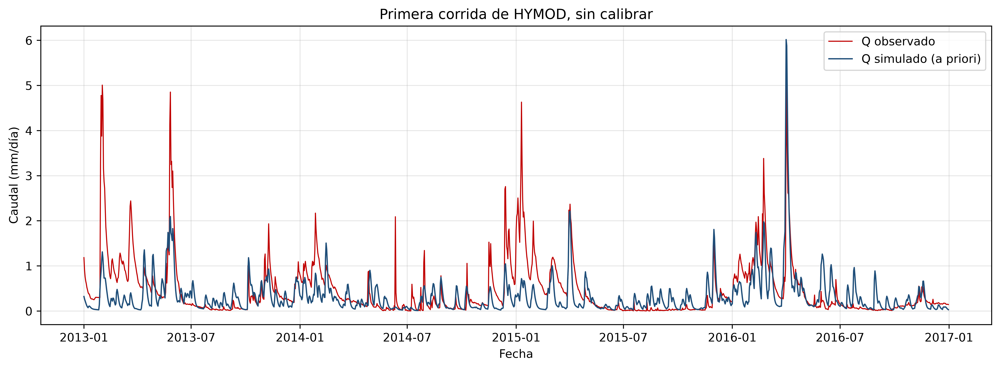

In [31]:
fig, ax = plt.subplots(figsize=(12, 4.5))
d = df.loc["2013":]
ax.plot(d.index, d["Q_mm"],  color="#c00000", lw=0.9, label="Q observado")
ax.plot(d.index, d["Q_sim"], color="#1f4e79", lw=1.1, label="Q simulado (a priori)")
ax.set_ylabel("Caudal (mm/día)"); ax.set_xlabel("Fecha")
ax.set_title("Primera corrida de HYMOD, sin calibrar")
ax.legend()
plt.tight_layout(); plt.show()

## 3.4 Mirar por dentro del modelo

Un hidrograma de salida no dice si el modelo está funcionando por las razones correctas. Los estados
internos sí. Estas tres gráficas son la traducción directa de los puntos 5 a 8 de la diapositiva de
credibilidad del protocolo.

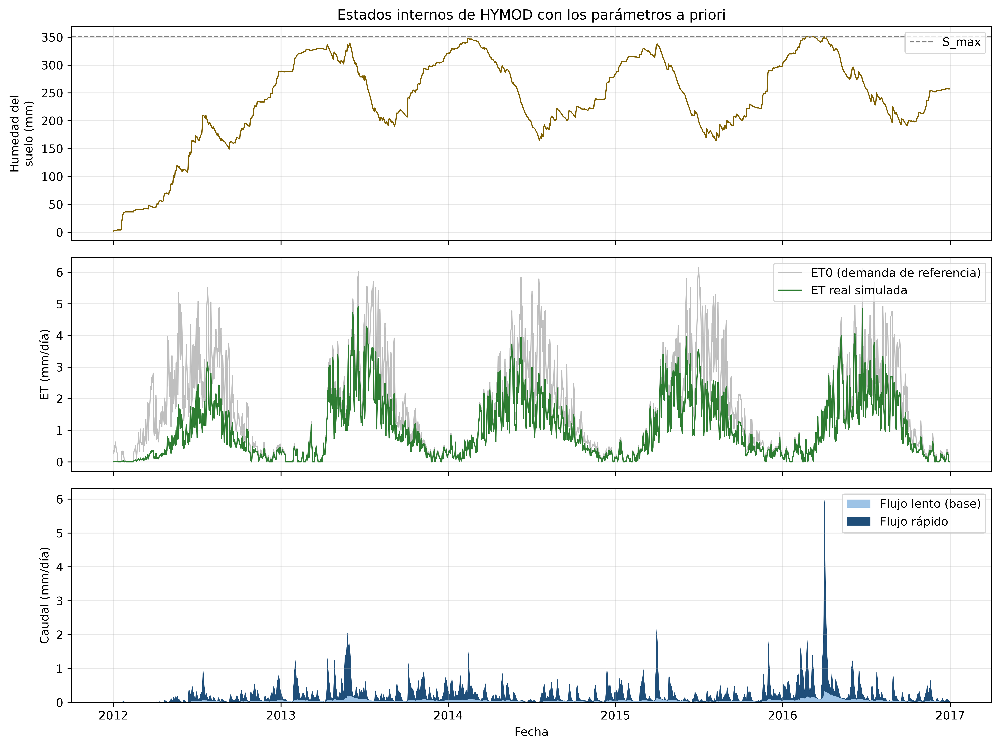

In [32]:
estados = pd.DataFrame({
    "humedad_suelo":    salida["humedad_suelo"],
    "almacen_transito": salida["almacen_transito"],
    "ET_real":          salida["ET"],
    "Q_rapido":         salida["Q_rapido"],
    "Q_lento":          salida["Q_lento"],
}, index=df.index)

fig, axs = plt.subplots(3, 1, figsize=(12, 9), sharex=True)

axs[0].plot(estados.index, estados["humedad_suelo"], color="#7f6000", lw=1)
axs[0].axhline(salida["S_max"], color="grey", ls="--", lw=1, label="S_max")
axs[0].set_ylabel("Humedad del\nsuelo (mm)"); axs[0].legend(loc="upper right")
axs[0].set_title("Estados internos de HYMOD con los parámetros a priori")

axs[1].plot(df.index, df["ET0_mm"], color="#bfbfbf", lw=0.9, label="ET0 (demanda de referencia)")
axs[1].plot(estados.index, estados["ET_real"], color="#2e7d32", lw=1.0, label="ET real simulada")
axs[1].set_ylabel("ET (mm/día)"); axs[1].legend(loc="upper right")

axs[2].stackplot(estados.index, estados["Q_lento"], estados["Q_rapido"],
                 labels=["Flujo lento (base)", "Flujo rápido"],
                 colors=["#9dc3e6", "#1f4e79"])
axs[2].set_ylabel("Caudal (mm/día)"); axs[2].set_xlabel("Fecha")
axs[2].legend(loc="upper right")

plt.tight_layout(); plt.show()

---
## ✏️ Ejercicio 3: Coherencia interna

La celda siguiente calcula tres verificaciones. **Córrala y luego responda.**

In [33]:
# Las tres verificaciones se hacen sobre el PERÍODO DE EVALUACIÓN, no sobre toda la
# serie. Incluir el calentamiento invalidaría el balance, ya que durante esos meses el modelo
# está llenando unos almacenamientos que arrancaron artificialmente en cero, y ese
# llenado aparece como si fuera agua que la cuenca retuvo de verdad.
EVAL = slice("2013-01-01", str(df.index.max().date()))
ev  = df.loc[EVAL]
est = estados.loc[EVAL]

# El almacenamiento al INICIO del período no es cero, es el que dejó el calentamiento.
S0_suelo    = estados["humedad_suelo"].shift(1).loc[EVAL].iloc[0]
S0_transito = estados["almacen_transito"].shift(1).loc[EVAL].iloc[0]

P_tot  = ev["P_mm"].sum()
ET_tot = est["ET_real"].sum()
Q_tot  = ev["Q_sim"].sum()
dS_suelo    = est["humedad_suelo"].iloc[-1]    - S0_suelo
dS_transito = est["almacen_transito"].iloc[-1] - S0_transito

print(f"Período evaluado: {ev.index.min().date()} a {ev.index.max().date()}  ({len(ev)} días)")
print("(el calentamiento queda fuera de todos los números que siguen)\n")

print("--- Verificación 1: balance de masa del modelo ---")
print(f"Entradas   P                    = {P_tot:10.2f} mm")
print(f"Salidas    ET                   = {ET_tot:10.2f} mm")
print(f"           Q                    = {Q_tot:10.2f} mm")
print(f"Almacena.  dS suelo             = {dS_suelo:10.2f} mm   "
      f"(de {S0_suelo:.1f} a {est['humedad_suelo'].iloc[-1]:.1f} mm)")
print(f"           dS tanques tránsito  = {dS_transito:10.2f} mm   "
      f"(de {S0_transito:.1f} a {est['almacen_transito'].iloc[-1]:.1f} mm)")
print(f"{'-'*46}")
residual = P_tot - ET_tot - Q_tot - dS_suelo - dS_transito
print(f"Residual   P - ET - Q - dS     = {residual:10.2e} mm")
print("   Debe ser cero salvo error de redondeo. Si no lo es, el código del")
print("   modelo está creando o destruyendo agua, y nada de lo que siga sirve.")

print("\n--- Verificación 2. La ET real no puede superar la demanda de referencia ---")
print(f"Días en que ET_real > ET0: {(est['ET_real'] > ev['ET0_mm'] + 1e-9).sum()}")
print(f"Relación ET_real / ET0 (media): {ET_tot / ev['ET0_mm'].sum():.2f}")

print("\n--- Verificación 3: índice de flujo base simulado ---")
print(f"Fracción del caudal que sale por el embalse lento: "
      f"{est['Q_lento'].sum() / Q_tot:.2f}")

print("\n--- Verificación 4: el modelo contra el residuo del balance ---")
obs = dias_comparables(df, ["P_mm", "ET0_mm", "Q_mm"], EVAL)
print(f"Sobre los {len(obs)} días con caudal observado dentro del período de evaluación:")
print(f"   residuo del balance (P - Q_obs) = {obs['P_mm'].mean() - obs['Q_mm'].mean():.3f} mm/día")
print(f"   ET simulada por el modelo       = {est.loc[obs.index, 'ET_real'].mean():.3f} mm/día")
print("   Recuerde la sección 2.3: el residuo no es una medición de ET, así que esta")
print("   comparación detecta discrepancias pero no arbitra cuál de los dos está mal.")

Período evaluado: 2013-01-01 a 2016-12-31  (1461 días)
(el calentamiento queda fuera de todos los números que siguen)

--- Verificación 1: balance de masa del modelo ---
Entradas   P                    =    2093.07 mm
Salidas    ET                   =    1648.95 mm
           Q                    =     476.43 mm
Almacena.  dS suelo             =     -30.64 mm   (de 287.7 a 257.1 mm)
           dS tanques tránsito  =      -1.67 mm   (de 2.1 a 0.4 mm)
----------------------------------------------
Residual   P - ET - Q - dS     =  -4.90e-12 mm
   Debe ser cero salvo error de redondeo. Si no lo es, el código del
   modelo está creando o destruyendo agua, y nada de lo que siga sirve.

--- Verificación 2. La ET real no puede superar la demanda de referencia ---
Días en que ET_real > ET0: 0
Relación ET_real / ET0 (media): 0.71

--- Verificación 3: índice de flujo base simulado ---
Fracción del caudal que sale por el embalse lento: 0.19

--- Verificación 4: el modelo contra el residuo del bal

> ✏️ **Respuesta 3.**
>
> **3a.** ¿La verificación 2 se cumple? Explique en una línea por qué el modelo *no puede*
> producir `ET_real > ET0`, mirando la línea del código donde se calcula `et`.
>
> *(segun los resultados encontramos que la verificación si se cumple, puesto que tenemos (Días en que ET_real > ET0 = 0) la ET real esta limitada por la disponibilidad de agua en el suelo y la Et de referencia)*
>
> **3b.** Compare la fracción de flujo base **simulada** (verificación 3) con lo que sugiere el
> hidrograma **observado** de la Parte 2. ¿Le parece que el modelo está repartiendo bien el agua entre
> flujo rápido y flujo base? ¿Qué parámetro tocaría para corregirlo?
>
> *(La Fracción del caudal que sale por el embalse lento = 0.19, osea 19% del caudal total es del embalse lento. Representa una contribución baja. Para aumentar la participación del caudal base, se debería aumentar el caudal de almacenamiento o el tiempo de residencia del agua, esto haría que una mayor proporsion de agua aporte más al caudal base.)*

---
# Parte 4 · Criterios de desempeño aceptable

> **Protocolo:** caja *Determinar criterios de desempeño aceptable*.

Una función objetivo (FO) resume en un número la distancia entre lo simulado y lo observado. El punto
de esta parte es que **no existe una única FO correcta**, dado que cada una favorece un aspecto distinto, y elegir cuál
usar es una decisión de modelación tan importante como elegir el modelo.

## 4.1 Las cinco funciones objetivo del taller

$$NSE = 1 - \frac{\sum (Q_{sim} - Q_{obs})^2}{\sum (Q_{obs} - \overline{Q_{obs}})^2}
\qquad\text{(1 es perfecto; 0 equivale a usar la media observada)}$$

$$KGE = 1 - \sqrt{(r-1)^2 + (\beta-1)^2 + (\gamma-1)^2}$$

donde $r$ es la correlación, $\beta = \overline{Q_{sim}}/\overline{Q_{obs}}$ el sesgo de volumen y
$\gamma$ la relación de coeficientes de variación (Gupta et al., 2009). El KGE resulta útil porque
**separa** esos tres errores en lugar de mezclarlos.

> **Los dos índices no comparten escala.** Un modelo que responda siempre con la media observada
> obtiene $NSE = 0$, pero $KGE = 1-\sqrt{2} \approx -0.41$ (Knoben et al., 2019). Comparar un NSE de
> 0.43 con un KGE de 0.37 como si fueran equivalentes induce a error. Cada índice se interpreta contra
> su propio referente.

$$PBIAS = 100\,\frac{\sum (Q_{sim} - Q_{obs})}{\sum Q_{obs}}
\qquad\text{(negativo = el modelo subestima el volumen)}$$

El **logNSE** es el NSE calculado sobre $\log Q$, de modo que comprime los picos y amplifica los caudales bajos,
así que mide qué tan bien se reproduce el estiaje. El **RMSE** está en las unidades del caudal, lo que
lo hace fácil de interpretar pero dificulta comparar entre cuencas.

In [34]:
def _limpiar(obs, sim):
    """Descarta los días sin observacion. Toda FO debe hacer esto primero."""
    obs = np.asarray(obs, dtype=float); sim = np.asarray(sim, dtype=float)
    m = np.isfinite(obs) & np.isfinite(sim)
    return obs[m], sim[m]


def nse(obs, sim):
    o, s = _limpiar(obs, sim)
    return 1 - np.sum((s - o) ** 2) / np.sum((o - o.mean()) ** 2)


def log_nse(obs, sim, eps=0.01):
    o, s = _limpiar(obs, sim)
    o, s = np.log(o + eps), np.log(np.maximum(s, 0) + eps)
    return 1 - np.sum((s - o) ** 2) / np.sum((o - o.mean()) ** 2)


def kge(obs, sim, componentes=False):
    o, s = _limpiar(obs, sim)
    r = np.corrcoef(o, s)[0, 1]
    beta = s.mean() / o.mean()                       # sesgo de volumen
    gamma = (s.std() / s.mean()) / (o.std() / o.mean())   # sesgo de variabilidad
    valor = 1 - np.sqrt((r - 1) ** 2 + (beta - 1) ** 2 + (gamma - 1) ** 2)
    return (valor, r, beta, gamma) if componentes else valor


def pbias(obs, sim):
    o, s = _limpiar(obs, sim)
    return 100 * np.sum(s - o) / np.sum(o)


def rmse(obs, sim):
    o, s = _limpiar(obs, sim)
    return np.sqrt(np.mean((s - o) ** 2))


def resumen(obs, sim):
    """Devuelve las cinco métricas en un diccionario."""
    return {"NSE": nse(obs, sim), "logNSE": log_nse(obs, sim), "KGE": kge(obs, sim),
            "PBIAS_%": pbias(obs, sim), "RMSE": rmse(obs, sim)}


# Verificación: una simulación perfecta debe dar NSE = KGE = 1 y PBIAS = 0
q = df["Q_mm"].values
print({k: round(v, 3) for k, v in resumen(q, q).items()})

{'NSE': np.float64(1.0), 'logNSE': np.float64(1.0), 'KGE': np.float64(1.0), 'PBIAS_%': np.float64(0.0), 'RMSE': np.float64(0.0)}


## 4.2 Cuatro modelos, cuatro respuestas

Aquí están cuatro combinaciones de parámetros para la misma cuenca y el mismo modelo. Tres de ellos salieron
de optimizar una FO distinta. Corra la celda y **lea la tabla con cuidado**.

In [35]:
CAL = slice("2013-01-01", "2014-12-31")
COMBINACIONES = {
    "A · a priori":      dict(cmax=412.33, b=0.173, alpha=0.813, Ks=0.0400, Kq=0.559),
    "B · óptimo NSE":    dict(cmax=139.69, b=0.100, alpha=0.556, Ks=0.0217, Kq=0.535),
    "C · óptimo logNSE": dict(cmax=141.81, b=0.100, alpha=0.461, Ks=0.0429, Kq=0.511),
    "D · sesgo cero":    dict(cmax=131.82, b=0.150, alpha=0.776, Ks=0.0674, Kq=0.811),
}

sim = {}
filas = {}
for nombre, par in COMBINACIONES.items():
    s = pd.Series(hymod(df["P_mm"].values, df["ET0_mm"].values, **par), index=df.index)
    sim[nombre] = s
    filas[nombre] = resumen(df.loc[CAL, "Q_mm"], s.loc[CAL])

tabla = pd.DataFrame(filas).T
tabla.round(3)

,NSE,logNSE,KGE,PBIAS_%,RMSE
A · a priori,0.290,0.193,0.422,-38.601,0.549
B · óptimo NSE,0.667,0.619,0.754,-4.081,0.376
C · óptimo logNSE,0.648,0.663,0.752,-4.728,0.387
D · sesgo cero,0.030,0.314,0.541,0.024,0.642


In [36]:
# Las tres componentes del KGE, por separado
CAL = slice("2013-01-01", "2014-12-31")
comp = {n: dict(zip(["KGE", "r (correlación)", "beta (volumen)", "gamma (variabilidad)"],
                    kge(df.loc[CAL, "Q_mm"], s.loc[CAL], componentes=True)))
        for n, s in sim.items()}
pd.DataFrame(comp).T.round(3)

,KGE,r (correlación),beta (volumen),gamma (variabilidad)
A · a priori,0.422,0.631,0.614,0.779
B · óptimo NSE,0.754,0.817,0.959,0.841
C · óptimo logNSE,0.752,0.806,0.953,0.852
D · sesgo cero,0.541,0.672,1.000,1.320


## 4.3 Las mismas simulaciones, vistas de tres formas

La tabla anterior no dice **dónde** falla cada modelo. Estas tres gráficas sí.

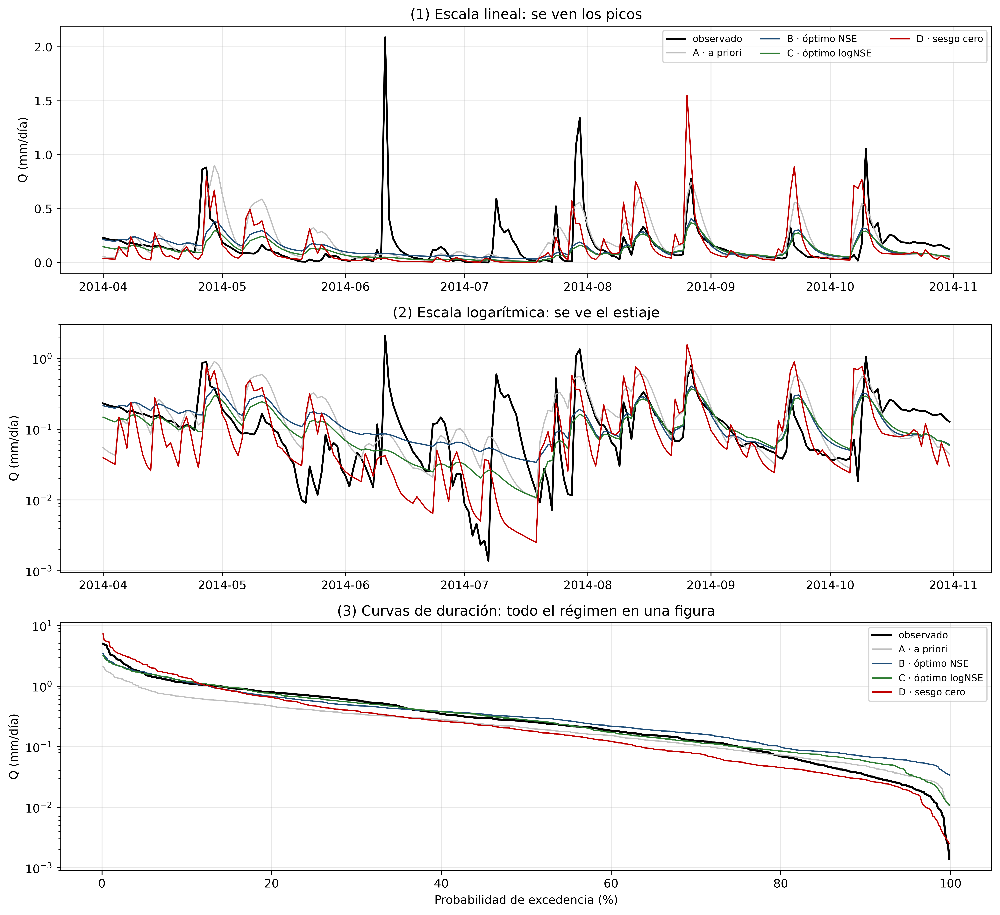

In [37]:
colores = {"A · a priori": "#bfbfbf", "B · óptimo NSE": "#1f4e79",
           "C · óptimo logNSE": "#2e7d32", "D · sesgo cero": "#c00000"}

fig, axs = plt.subplots(3, 1, figsize=(12, 11))

# (1) Hidrograma en escala lineal: manda el pico
d = df.loc["2014-04-01":"2014-10-31"]
axs[0].plot(d.index, d["Q_mm"], color="k", lw=1.6, label="observado")
for n, s in sim.items():
    axs[0].plot(d.index, s.loc[d.index], color=colores[n], lw=1.1, label=n)
axs[0].set_title("(1) Escala lineal: se ven los picos"); axs[0].set_ylabel("Q (mm/día)")
axs[0].legend(fontsize=8, ncol=3)

# (2) Hidrograma en escala logarítmica: manda el estiaje
axs[1].plot(d.index, d["Q_mm"], color="k", lw=1.6, label="observado")
for n, s in sim.items():
    axs[1].plot(d.index, s.loc[d.index], color=colores[n], lw=1.1, label=n)
axs[1].set_yscale("log")
axs[1].set_title("(2) Escala logarítmica: se ve el estiaje"); axs[1].set_ylabel("Q (mm/día)")

# (3) Curvas de duración
pr, qq = curva_duracion(df.loc[CAL, "Q_mm"])
axs[2].plot(pr, qq, color="k", lw=1.8, label="observado")
for n, s in sim.items():
    pr_s, q_s = curva_duracion(s.loc[CAL])
    axs[2].plot(pr_s, q_s, color=colores[n], lw=1.1, label=n)
axs[2].set_yscale("log")
axs[2].set_xlabel("Probabilidad de excedencia (%)"); axs[2].set_ylabel("Q (mm/día)")
axs[2].set_title("(3) Curvas de duración: todo el régimen en una figura")
axs[2].legend(fontsize=8)

plt.tight_layout(); plt.show()

---
## ✏️ Ejercicio 4: Elegir la función objetivo

Mire la tabla de la sección 4.2 y las gráficas de la 4.3, y responda:

**4a.** La combinación **D** tiene `PBIAS` cercano a 0%, es decir, reproduce el volumen total de agua de forma casi exacta.
Sin embargo, su `NSE` es prácticamente cero. Recuerde qué significa un NSE de cero y explique por qué
un `PBIAS` casi perfecto **no** garantiza un buen modelo.

> ✏️ *(Un NSE cercano a 0 significa que el modelo no mejora sustancialmente la predicción respecto a usar la media observada; por tanto, D puede conservar el volumen total y aun así representar mal los picos, Un PBIAS cercano a 0% solo indica que el volumen total simulado es similar al observado, pero no que el modelo reproduzca correctamente la dinámica del caudal.)*

**4b.** Suponga tres propósitos de modelación distintos (caja 1 del protocolo). Para cada uno diga qué
FO usaría como criterio principal y por qué, en una línea:

| Propósito | FO principal | Por qué |
|---|---|---|
| Diseño de un vertedero de creciente | NSE | Busca evaluar errores grandes, osea que tanto pueden crecer picos de creciente para dimensionar |
| Evaluar la oferta hídrica en época seca para una concesión de agua | logNSE | Ayudaría a evaluar los niveles de caudales bajos y necesidades|
| Cerrar el balance hídrico anual de la cuenca | PBIAS | Evaluaría si el caudal que se simula es igual al observado, aunque hay pensar en la distribución temporal|

**4c.** ¿Cuál de las cuatro combinaciones escogería usted si el propósito fuera **operar un embalse de
abastecimiento**? Justifique en dos líneas usando al menos dos métricas de la tabla.

> ✏️ *(Creería que el Optimo NSE, tiene un PBIAS de -4.081 muestra un bajo sesgo de volumen, conocer lo más acercado a la realidad este parametro ayuda a la gestión del riesgo del embalse. Tambien presente el NSE EN 0.667 y KGE 0.754, esto es un desempeño mas equilibrado)*

---
# Parte 5 · Estimación de parámetros por ensayo y error

> **Protocolo:** caja *Estimación de parámetros*. Esta es la calibración **manual** de la diapositiva
> correspondiente, dado que el ajuste es subjetivo, depende de la habilidad del modelador y requiere
> normalmente diez o muchas más iteraciones.

La herramienta siguiente es una sola función, que cambia parámetros, corre el modelo y calcula las métricas **en el
período de calibración**, grafica y guarda el resultado en una bitácora.

In [38]:
bitacora = []      # aquí se van acumulando todos los intentos


def probar(cmax, b, alpha, Ks, Kq, nota="", graficar=True):
    """Corre HYMOD, evalúa en el período de calibración y registra el intento."""
    par = dict(cmax=cmax, b=b, alpha=alpha, Ks=Ks, Kq=Kq)
    faltan = [k for k, v in par.items() if v is Ellipsis]
    if faltan:
        raise ValueError("Reemplace los '...' por valores numéricos en: " + ", ".join(faltan))
    s = pd.Series(hymod(df["P_mm"].values, df["ET0_mm"].values, **par), index=df.index)

    m = resumen(df.loc[CAL, "Q_mm"], s.loc[CAL])
    bitacora.append({"intento": len(bitacora) + 1, **par, **m, "nota": nota})

    if graficar:
        d = df.loc[CAL]
        fig, ax = plt.subplots(figsize=(12, 3.8))
        ax.plot(d.index, d["Q_mm"], color="k", lw=1.2, label="observado")
        ax.plot(d.index, s.loc[CAL], color="#1f4e79", lw=1.0, label="simulado")
        ax.set_ylabel("Q (mm/día)")
        ax.set_title(f"Intento {len(bitacora)}  |  NSE={m['NSE']:.3f}   logNSE={m['logNSE']:.3f}   "
                     f"KGE={m['KGE']:.3f}   PBIAS={m['PBIAS_%']:+.1f}%   {nota}")
        ax.legend(); plt.tight_layout(); plt.show()

    return s


def ver_bitacora():
    return (pd.DataFrame(bitacora)
              .set_index("intento")
              .round({"cmax": 1, "b": 3, "alpha": 3, "Ks": 4, "Kq": 3,
                      "NSE": 3, "logNSE": 3, "KGE": 3, "PBIAS_%": 1, "RMSE": 4}))


print("Listo. Use probar(...) tantas veces como quiera.")

Listo. Use probar(...) tantas veces como quiera.


## 5.1 Tres intentos guiados

Los tres primeros los hacemos juntos, para ver cómo se mueve cada parámetro.

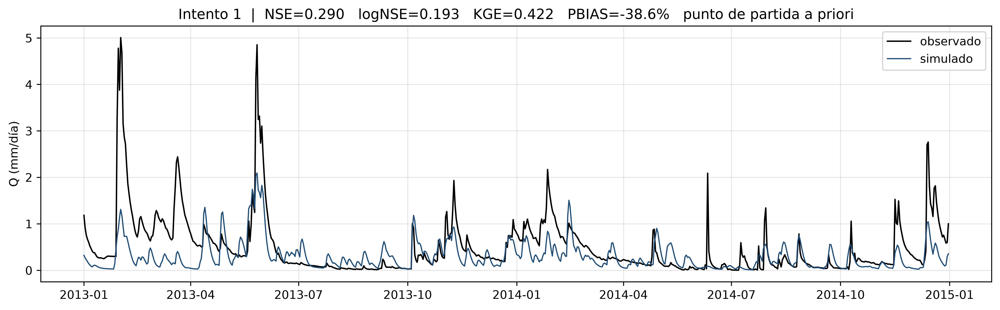

In [39]:
_ = probar(cmax=412.33, b=0.173, alpha=0.813, Ks=0.040, Kq=0.559,
           nota="punto de partida a priori")

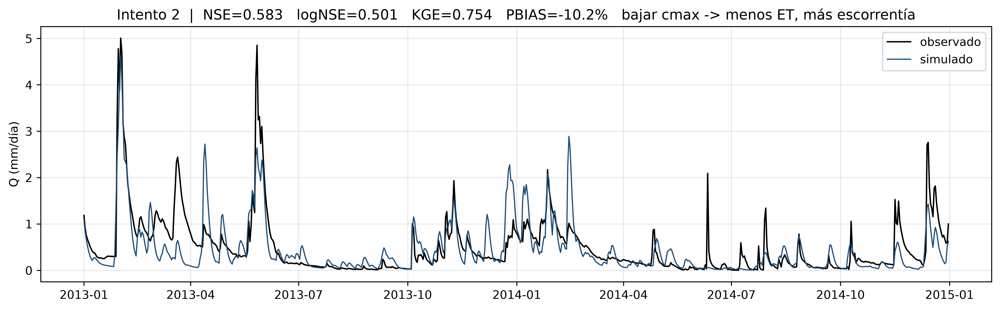

In [40]:
# El modelo subestima el volumen: hay demasiado almacenamiento de suelo, se evapora de más.
# Bajamos cmax.
_ = probar(cmax=200.0, b=0.173, alpha=0.813, Ks=0.040, Kq=0.559,
           nota="bajar cmax -> menos ET, más escorrentía")   # NSE pasa de 0.29 a 0.58

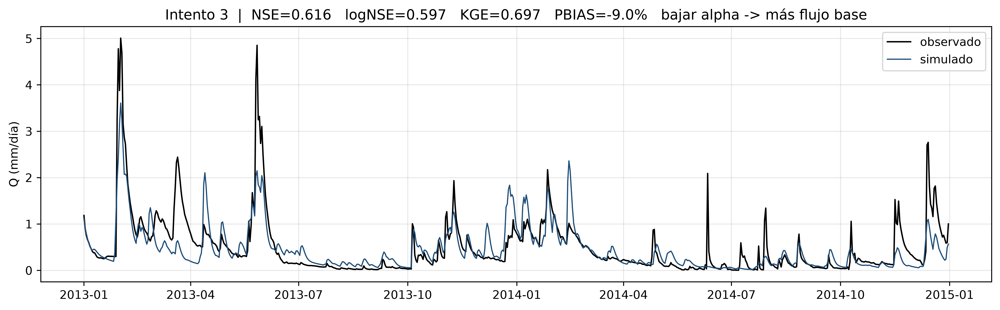

In [41]:
# Ahora el reparto: alpha muy alto manda casi todo al flujo rápido.
_ = probar(cmax=200.0, b=0.173, alpha=0.550, Ks=0.040, Kq=0.559,
           nota="bajar alpha -> más flujo base")

---
## ✏️ Ejercicio 5: Su turno

**5a.** Haga **al menos cuatro intentos más** buscando mejorar el NSE. Cambie **un parámetro a la
vez** y anote en `nota=` qué esperaba que pasara. Guía rápida de qué mueve qué:

- Volumen total mal (`PBIAS` grande) → `cmax` y, en segundo lugar, `b`.
- Picos muy bajos o muy altos → `alpha` y `Kq`.
- Recesión demasiado rápida o demasiado lenta → `Ks`.

*Meta sugerida: NSE > 0.60 en el período de calibración. El mejor valor alcanzable con este modelo y
estos datos está alrededor de 0.67. No espere una mejora monótona, ya que es normal que un intento empeore
el resultado (eso también es información).*

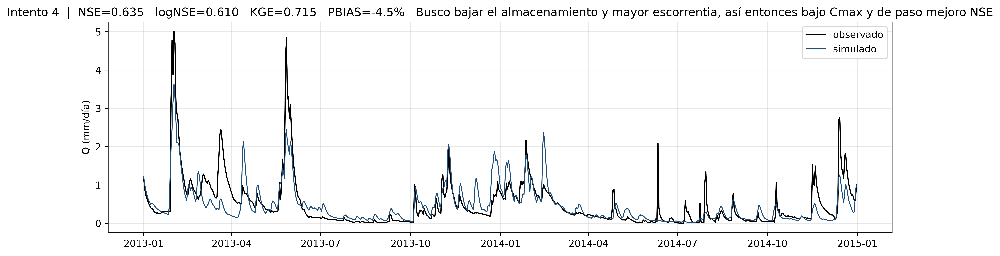

In [42]:
# ✏️ Intento 4
_ = probar(cmax=170.0, b=0.173, alpha=0.550, Ks=0.040, Kq=0.559, nota="Busco bajar el almacenamiento y mayor escorrentia, así entonces bajo Cmax y de paso mejoro NSE")

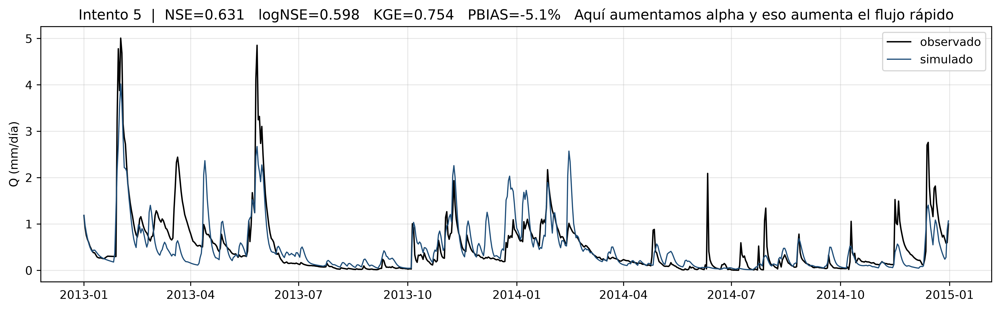

In [43]:
# ✏️ Intento 5
_ = probar(cmax=170.0, b=0.173, alpha=0.650, Ks=0.040, Kq=0.559, nota="Aquí aumentamos alpha y eso aumenta el flujo rápido")

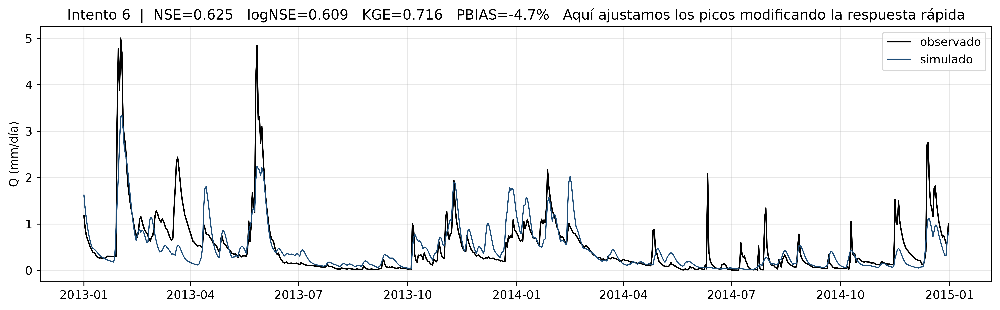

In [44]:
# ✏️ Intento 6
_ = probar(cmax=170.0, b=0.173, alpha=0.650, Ks=0.040, Kq=0.450, nota="Aquí ajustamos los picos modificando la respuesta rápida")

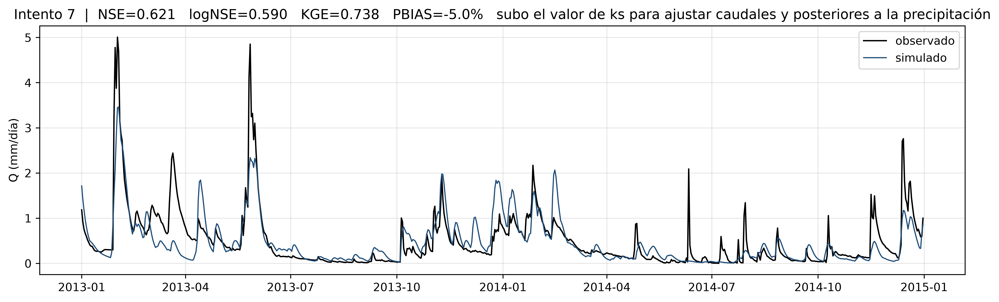

In [45]:
# ✏️ Intento 7
_ = probar(cmax=170.0, b=0.173, alpha=0.650, Ks=0.060, Kq=0.450, nota="subo el valor de ks para ajustar caudales y posteriores a la precipitación")

In [46]:
ver_bitacora()

,cmax,b,alpha,Ks,Kq,NSE,logNSE,KGE,PBIAS_%,RMSE,nota
intento,,,,,,,,,,,
1,412.3,0.173,0.813,0.04,0.559,0.290,0.193,0.422,-38.6,0.5492,punto de partida a priori
2,200.0,0.173,0.813,0.04,0.559,0.583,0.501,0.754,-10.2,0.4206,"bajar cmax -> menos ET, más escorrentía"
3,200.0,0.173,0.550,0.04,0.559,0.616,0.597,0.697,-9.0,0.4041,bajar alpha -> más flujo base
4,170.0,0.173,0.550,0.04,0.559,0.635,0.610,0.715,-4.5,0.3935,Busco bajar el almacenamiento y mayor escorren...
5,170.0,0.173,0.650,0.04,0.559,0.631,0.598,0.754,-5.1,0.3959,Aquí aumentamos alpha y eso aumenta el flujo r...
6,170.0,0.173,0.650,0.04,0.450,0.625,0.609,0.716,-4.7,0.3989,Aquí ajustamos los picos modificando la respue...
7,170.0,0.173,0.650,0.06,0.450,0.621,0.590,0.738,-5.0,0.4014,subo el valor de ks para ajustar caudales y po...


**5b.** Tome su mejor combinación de parámetros y evalúelo en el período de **aceptabilidad**, que hasta
ahora no ha tocado. Este es el paso *Prueba de aceptabilidad* del protocolo.

In [47]:
mejor = ver_bitacora().sort_values("NSE", ascending=False).iloc[0]
PAR_MEJOR = {k: float(mejor[k]) for k in ["cmax", "b", "alpha", "Ks", "Kq"]}
print("Mejor combinación encontrada:", {k: round(v, 3) for k, v in PAR_MEJOR.items()})

s_final = pd.Series(hymod(df["P_mm"].values, df["ET0_mm"].values, **PAR_MEJOR), index=df.index)

comparacion = pd.DataFrame({
    "Calibración":   resumen(df.loc[CAL, "Q_mm"], s_final.loc[CAL]),
    "Aceptabilidad": resumen(df.loc[ACE, "Q_mm"], s_final.loc[ACE]),
})
comparacion.round(3)

Mejor combinación encontrada: {'cmax': 170.0, 'b': 0.173, 'alpha': 0.55, 'Ks': 0.04, 'Kq': 0.559}


,Calibración,Aceptabilidad
NSE,0.635,0.619
logNSE,0.610,0.531
KGE,0.715,0.676
PBIAS_%,-4.526,23.609
RMSE,0.394,0.386


> ✏️ **Respuesta 5b.** ¿El desempeño cae al pasar al período de aceptabilidad? ¿Cuánto?
> Según el protocolo, ¿qué haría usted si el modelo **no** pasa la prueba de aceptabilidad, es decir, volver a
> qué caja del diagrama?
>
> *(Sí, el desempeño disminuye ligeramente en aceptabilidad: el NSE pasa de 0.635 a 0.619, el logNSE de 0.610 a 0.531 y el KGE de 0.715 a 0.676. El cambio más notable está en el PBIAS, que pasa de −4.526 % a 23.609 %, indicando mayor sobreestimación de los caudales. Si el modelo no pasa la prueba de aceptabilidad, se debe volver a la caja de calibración, ajustar el modelo y posteriormente repetir la prueba de aceptabilidad.)*

## 5.2 Reto: equifinalidad en 1000 corridas con simulaciones de Monte Carlo

La calibración manual sirve para entender el modelo, pero no para explorar el espacio de parámetros.

La celda siguiente hace lo que más adelante reemplazaremos con herramientas como SPOTPY con algoritmos de optimización más sofisticados. Muestrear 1000 combinaciones de parámetros al azar y graficar cada parámetro contra el NSE que produjo (los llamados *dotty plots*) se llama ejecutar **SIMULACIONES DE MONTE CARLO**.

Lo que va a ver es **equifinalidad**, esto es, combinaciones de parámetros muy distintos que dan desempeños casi idénticos.

Mejor NSE de las 1000 corridas al azar: 0.619
Corridas con NSE > 0.60: 1


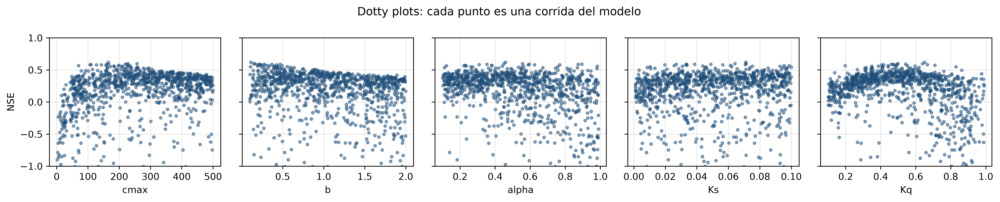

,cmax,b,alpha,Ks,Kq,NSE
322,164.852,0.110,0.459,0.071,0.651,0.619
720,256.853,0.146,0.556,0.064,0.498,0.597
728,228.104,0.159,0.450,0.071,0.639,0.597
591,224.655,0.210,0.895,0.033,0.542,0.589
276,159.678,0.467,0.595,0.049,0.460,0.587
756,166.037,0.368,0.874,0.027,0.469,0.587
40,219.139,0.274,0.353,0.039,0.494,0.586
481,109.597,0.227,0.309,0.071,0.666,0.581
993,106.765,0.235,0.589,0.033,0.416,0.580
266,143.075,0.424,0.769,0.020,0.476,0.578


In [48]:
rng = np.random.default_rng(42)
N = 1000
LIM = {"cmax": (1, 500), "b": (0.1, 2.0), "alpha": (0.1, 0.99),
       "Ks": (0.001, 0.10), "Kq": (0.1, 0.99)}

muestras = {k: rng.uniform(lo, hi, N) for k, (lo, hi) in LIM.items()}
obj = np.empty(N)
for i in range(N):
    par = {k: muestras[k][i] for k in LIM}
    s = hymod(df["P_mm"].values, df["ET0_mm"].values, **par)
    obj[i] = nse(df.loc[CAL, "Q_mm"], pd.Series(s, index=df.index).loc[CAL])

mc = pd.DataFrame(muestras); mc["NSE"] = obj
print(f"Mejor NSE de las {N} corridas al azar: {mc['NSE'].max():.3f}")
print(f"Corridas con NSE > 0.60: {(mc['NSE'] > 0.60).sum()}")

fig, axs = plt.subplots(1, 5, figsize=(15, 3), sharey=True)
for ax, k in zip(axs, LIM):
    ax.scatter(mc[k], mc["NSE"], s=8, alpha=0.5, color="#1f4e79")
    ax.set_xlabel(k); ax.set_ylim(-1, 1)
axs[0].set_ylabel("NSE")
fig.suptitle("Dotty plots: cada punto es una corrida del modelo")
plt.tight_layout(); plt.show()

mc.sort_values("NSE", ascending=False).head(10).round(3)

> ✏️ **Respuesta 5c (reto).** Mire las 10 mejores combinaciones de la tabla. ¿Los valores de `cmax` de
> esas 10 simulaciones son parecidos entre sí? ¿Y los de `Ks`? Un parámetro cuyos buenos valores están muy
> dispersos se llama **poco identificable**. ¿Cuál de los cinco parámetros le parece el más
> identificable y cuál el menos? ¿Qué implica eso para interpretarlos físicamente?
>
> *(Los valores de cmax y Ks presentan bastante dispersión entre las 10 mejores simulaciones. El parámetro más estable diria que es Kq, mientras que alpha es el menos identificable por su mayor dispersión. Esto implica que algunos parámetros pueden estimarse con mayor confianza que otros y que, debido a la equifinalidad, no necesariamente existe una única combinación de parámetros con una verdad total.)*

---
# Parte 6: Tres cuencas colombianas

> **Protocolo:** volvemos a la primera caja. Con datos reales, *establecer el propósito* y *evaluar los
> datos* dejan de ser trámites.

Hasta aquí trabajamos con una cuenca experimental de 1.8 km², con datos completos y sin vacíos. Ahora vamos a mirar tres cuencas colombianas reales del conjunto **CAMELS-COL**
(Jiménez et al., 2025), con precipitación satelital CHIRPS, temperaturas de MSWX y caudales del IDEAM.

| | Cuenca **llanera** | Cuenca **andina** | Cuenca **Caribe** |
|---|---|---|---|
| Estación IDEAM | 35127020 | 21167080 | 28037030 |
| Departamento | Meta | Tolima | Cesar |
| Área | 1 894.8 km² | 446.8 km² | 3 434.1 km² |
| Elevación media de la cuenca | 211 m | 1 560 m | 1 164 m |
| Elevación de la estación | 149 m | 415 m | 108 m |
| Precipitación | 2 700 mm/año | 1 835 mm/año | 1 520 mm/año |
| Régimen de lluvias | **unimodal** (abril a octubre) | **bimodal** (abril y noviembre) | **bimodal** con temporada seca larga |
| Período del taller | 2001–2008 | 2001–2008 | 2001–2008 |

Las tres series traen `P_mm` (CHIRPS), la columna `ETP_mm` que publica el conjunto original,
temperaturas mínima y máxima, y `Q` observado, ya convertido a lámina de agua (`Q_mm`) con el área de cada
cuenca. Siguiendo la nomenclatura fijada en la Parte 3, en lo que sigue reservamos $ET_0$ para la
evapotranspiración de referencia que calculamos nosotros y dejamos `ETP_mm` como el nombre del dato
publicado, sin suponer que ambos coincidan.

## 6.1 Cálculo propio de la evapotranspiración de referencia

Los archivos traen una columna `ETP_mm` tomada del conjunto original, pero en este taller vamos a
calcular nuestra propia evapotranspiración de referencia. Las temperaturas mínima y máxima diarias
vienen en el mismo archivo, y con ellas basta para aplicar la fórmula de Hargreaves-Samani.

$$ET_0 = 0.0023\;R_a\;(T_{media} + 17.8)\;\sqrt{T_{max}-T_{min}}$$

$R_a$ es la **radiación extraterrestre**, la energía solar que llega al tope de la atmósfera. Depende
solo de la latitud y del día del año (no del clima), así que se calcula exactamente, sin necesidad de
ningún dato medido. La fórmula la exige expresada como **lámina de agua equivalente (mm/día)** y no como
energía. La conversión usa el calor latente de vaporización del agua, cercano a 2.45 MJ kg⁻¹ a 20 °C,
de modo que evaporar 1 mm consume 2.45 MJ por metro cuadrado.

Calcular uno mismo el forzamiento tiene dos ventajas. La primera es que usted sabe exactamente qué está
usando y bajo qué supuestos, en lugar de heredar la definición de otro. La segunda es que le da una
referencia propia contra la cual comparar cualquier producto que le entreguen, que es parte de la caja
*evaluar datos y necesidades de datos* del protocolo.

In [49]:
def radiacion_extraterrestre(lat_grados, dia_del_anio):
    """Radiación extraterrestre Ra, en mm/día de agua equivalente (FAO-56, ec. 21 a 25).

    Es la energía solar que llega al tope de la atmósfera. Depende solo de la
    latitud y del día del año, así que se calcula exactamente, sin datos medidos.
    """
    phi = np.radians(lat_grados)
    dr  = 1 + 0.033 * np.cos(2 * np.pi * dia_del_anio / 365)      # distancia Tierra-Sol
    dec = 0.409 * np.sin(2 * np.pi * dia_del_anio / 365 - 1.39)   # declinación solar
    ws  = np.arccos(np.clip(-np.tan(phi) * np.tan(dec), -1, 1))   # ángulo horario del ocaso
    Ra_MJ = (24 * 60 / np.pi) * 0.0820 * dr * (
        ws * np.sin(phi) * np.sin(dec) + np.cos(phi) * np.cos(dec) * np.sin(ws))
    return Ra_MJ / 2.45      # 1 mm de agua evaporada consume 2.45 MJ m-2


def et0_hargreaves(T_min, T_max, lat_grados, fechas):
    """Evapotranspiración de referencia diaria, Hargreaves-Samani (1985), en mm/día."""
    Ra = radiacion_extraterrestre(lat_grados, fechas.dayofyear.values)
    T_media = (T_max + T_min) / 2
    return 0.0023 * Ra * (T_media + 17.8) * np.sqrt(np.clip(T_max - T_min, 0, None))


# Prueba de verificación: en el equinoccio y sobre el ecuador, Ra vale ~37.6 MJ m-2 d-1 (FAO-56)
ra = radiacion_extraterrestre(0, 80)
print(f"Ra en el ecuador, 21 de marzo: {ra:.2f} mm/día = {ra * 2.45:.1f} MJ m-2 d-1")

Ra en el ecuador, 21 de marzo: 15.44 mm/día = 37.8 MJ m-2 d-1


In [50]:
CUENCAS = {
    "Llanera (Meta, 35127020)":  {"archivo": "cuenca_llanos_35127020.csv", "area": 1894.80, "lat": 4.31},
    "Andina (Tolima, 21167080)": {"archivo": "cuenca_andina_21167080.csv", "area":  446.82, "lat": 3.70},
    "Caribe (Cesar, 28037030)":  {"archivo": "cuenca_caribe_28037030.csv", "area": 3434.05, "lat": 10.32},
}

col = {}
for nombre, info in CUENCAS.items():
    d = pd.read_csv(DATOS / info["archivo"], parse_dates=["fecha"]).set_index("fecha").asfreq("D")
    huecos = int(d["P_mm"].isna().sum())
    # El caudal observado puede tener huecos (esos días no entran en las métricas), pero
    # el forzamiento no: si P o las temperaturas traen un NaN, el modelo lo arrastra y a
    # partir de ahí toda la simulación se vuelve NaN. Hay que rellenarlo y dejar constancia.
    for c in ["P_mm", "T_min_C", "T_max_C"]:      # ETP_mm no se usa, no se interpola
        d[c] = d[c].interpolate(limit_direction="both")

    # La ET0 que vamos a usar la calculamos nosotros, con la fórmula que declaran los
    # autores de CAMELS-COL y las temperaturas de su propio archivo.
    d["ET0_mm"] = et0_hargreaves(d["T_min_C"], d["T_max_C"], info["lat"], d.index)
    col[nombre] = d
    print(f"{nombre:28s} {len(d)} días | sin caudal: {int(d['Q_m3s'].isna().sum()):4d} | "
          f"forzamiento interpolado: {huecos:3d} días")

Llanera (Meta, 35127020)     2922 días | sin caudal:    5 | forzamiento interpolado:   5 días
Andina (Tolima, 21167080)    2922 días | sin caudal:    2 | forzamiento interpolado:   2 días
Caribe (Cesar, 28037030)     2922 días | sin caudal:   47 | forzamiento interpolado:  47 días


## 6.2 Tres regímenes en una figura

El ciclo anual medio (climatología mensual) es un resumen inicial muy informativo de una cuenca. Las
series graficadas allí van en las mismas unidades (mm/mes), para que las alturas de las barras y de la línea se
puedan comparar directamente. La diferencia entre la lluvia y el caudal es, como una primera aproximación, lo que se
evapora.

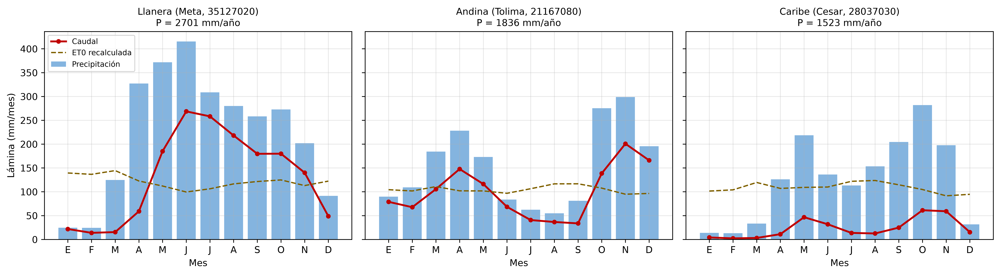

In [51]:
DIAS_MES = np.array([31, 28.25, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31])
MESES = list("EFMAMJJASOND")

fig, axs = plt.subplots(1, 3, figsize=(15, 4.2), sharey=True)

for ax, (nombre, d) in zip(axs, col.items()):
    # De mm/día a mm/mes: el promedio diario de cada mes por sus días
    P_mes = d["P_mm"].groupby(d.index.month).mean().values * DIAS_MES
    Q_mes = d["Q_mm"].groupby(d.index.month).mean().values * DIAS_MES
    E_mes = d["ET0_mm"].groupby(d.index.month).mean().values * DIAS_MES
    meses = np.arange(1, 13)

    ax.bar(meses, P_mes, color="#5b9bd5", alpha=0.75, label="Precipitación")
    ax.plot(meses, Q_mes, color="#c00000", lw=2, marker="o", ms=4, label="Caudal")
    ax.plot(meses, E_mes, color="#7f6000", lw=1.4, ls="--", label="ET0 recalculada")
    ax.set_xticks(meses); ax.set_xticklabels(MESES)
    ax.set_title(f"{nombre}\n" + f"P = {P_mes.sum():.0f} mm/año", fontsize=10)
    ax.set_xlabel("Mes")

axs[0].set_ylabel("Lámina (mm/mes)")
axs[0].legend(fontsize=8, loc="upper left")
plt.tight_layout(); plt.show()

**Lea las tres figuras antes de seguir.**

- **Llanera:** una sola temporada de lluvias, de abril a octubre, y una estación seca corta y profunda
  en diciembre–febrero. Es el régimen unimodal clásico de la Orinoquía.
- **Andina:** dos temporadas de lluvia, abril y noviembre, separadas por dos períodos secos. Ninguno de
  los dos mínimos es severo, la cuenca nunca se seca del todo.
- **Caribe:** también dos picos, mayo y octubre, pero precedidos por cuatro meses (diciembre a marzo)
  con menos de 35 mm/mes. Es bimodal, pero con una estación seca larga, que es el régimen típico del
  valle del Cesar.

Observe ahora la línea de la ET0. Es **casi plana** en las tres cuencas, porque la demanda atmosférica
en el trópico varía poco a lo largo del año. La precipitación, en cambio, varía entre el mes más seco y
el más húmedo en un factor de 18 en la cuenca llanera, de 22 en la del Caribe y de 5 en la andina. Esa
asimetría marca una diferencia de fondo con las latitudes medias, donde el ciclo de la
evapotranspiración pesa tanto como el de la precipitación. **Aquí el régimen hidrológico queda definido
casi enteramente por la lluvia.**

La consecuencia se ve en el panel del Caribe, donde de diciembre a marzo la precipitación cae por debajo de la
demanda atmosférica, con déficits de 70 a 100 mm/mes durante cuatro meses seguidos. En ese período no
queda agua disponible para escorrentía, y eso ya anticipa un coeficiente de escorrentía bajo.

## 6.3 La prueba de consistencia que hicimos en la Parte 2, ahora con datos reales

En la Parte 2 dijimos que $P - Q$ es un residuo y no una medición, y que el supuesto
$\Delta S \approx 0$ no se sostiene para un año aislado. Con ocho años de tres cuencas ya podemos
ponerle número a esa afirmación en vez de repetirla. Por simplicidad, en este taller usamos un período de 8 años.
No obstante, cuando hablamos de "largo plazo" es conveniente trabajar con series de 20 o 30 años.

Si el almacenamiento no cambiara nunca, el residuo anual $P - Q$ sería igual todos los años salvo por la
variación real de la evapotranspiración, que en el trópico es pequeña porque la demanda atmosférica casi
no cambia de un año a otro. Todo lo que sobre de esa diferencia es, en buena parte, agua que un año se
guardó y que en otro se liberó.|

In [52]:
resumen_anual = {}
for nombre, d in col.items():
    a = d.resample("YS").agg(P=("P_mm", "sum"), Q=("Q_mm", "sum"), n=("Q_mm", "count"))
    a = a[a["n"] > 350]                       # solo años prácticamente completos
    res = a["P"] - a["Q"]
    resumen_anual[nombre] = {
        "años": len(a),
        "residuo medio (mm/año)": res.mean(),
        "desv. entre años (mm/año)": res.std(),
        "dispersión (%)": 100 * res.std() / res.mean(),
        "error del promedio (mm/año)": res.std() / np.sqrt(len(a)),
        "error del promedio (%)": 100 * res.std() / np.sqrt(len(a)) / res.mean(),
    }
pd.DataFrame(resumen_anual).T.round(1)

,años,residuo medio (mm/año),desv. entre años (mm/año),dispersión (%),error del promedio (mm/año),error del promedio (%)
"Llanera (Meta, 35127020)",8.0,1118.4,103.7,9.3,36.7,3.3
"Andina (Tolima, 21167080)",8.0,637.2,63.1,9.9,22.3,3.5
"Caribe (Cesar, 28037030)",7.0,1267.2,67.5,5.3,25.5,2.0


**Cómo se lee.** El residuo anual se mueve entre un 5 y un 10 % alrededor de su media según el año.
Ese es el orden de magnitud del error que se comete al estimar una ET con un **solo** año de datos, del
orden de ±100 mm/año, que en la cuenca andina es una sexta parte del total. Al promediar siete u ocho
años esa fluctuación se cancela en buena medida y el error del promedio baja a un 2 o 3 %. **Por eso el
balance hídrico en donde se supone un estado estable se hace sobre varios años y no sobre uno.**

Conviene precisar el alcance de ese resultado. Promediar reduce la componente **aleatoria** del error,
la que fluctúa entre años húmedos y secos, pero no altera la componente **sistemática**. Si la cuenca
pierde agua por flujo subterráneo hacia la cuenca vecina, si alguien capta agua aguas arriba, o si el
producto de precipitación a partir de datos satelitales tiene un sesgo, eso está presente todos los años por igual y ningún promedio lo
elimina. Ahí el residuo sigue absorbiéndolo todo, y sigue sin ser una ET.

Hecha esa advertencia, el residuo admite dos usos. **Primero**, compararlo con la ET0, ya que el
cociente entre los dos es, si los supuestos se cumplen, la fracción de la demanda atmosférica que la
cuenca alcanza a satisfacer. En una cuenca con temporada seca larga no debería acercarse a 1, porque
durante meses no hay agua que evaporar. **Segundo**, contrastarlo con la **curva de Budyko**, que dice
cuánta agua debería salir de una cuenca conociendo solo su índice de aridez $\phi = ET_0/P$:

$$\frac{ET}{P} = \sqrt{\phi \,\tanh\!\left(\frac{1}{\phi}\right)\left(1 - e^{-\phi}\right)}$$

de donde el coeficiente de escorrentía esperado es $C = 1 - ET/P$. No es una ley física ni una
predicción, es el comportamiento medio de cientos de cuencas del mundo, y parte del mismo
supuesto de cierre que acabamos de discutir. Una cuenca que se aparta de esa curva no está
necesariamente mal medida, pero debe llamar la atención del modelador.

In [55]:
def budyko_C(aridez):
    """Coeficiente de escorrentía esperado según la curva de Budyko (1974)."""
    return 1 - np.sqrt(
        aridez * np.tanh(1 / aridez) * (1 - np.exp(-aridez))
    )

filas = []

for nombre, d in col.items():

    # Usamos solo los días en que P, ET0 y Q están definidos
    c = d[["P_mm", "ET0_mm", "Q_mm"]].dropna()

    P_, E_, Q_ = (
        c["P_mm"].mean(),
        c["ET0_mm"].mean(),
        c["Q_mm"].mean()
    )

    aridez = E_ / P_

    filas.append({
        "cuenca": nombre,
        "días usados": len(c),
        "P (mm/año)": P_ * 365,
        "ET0 (mm/año)": E_ * 365,
        "Q obs (mm/año)": Q_ * 365,
        "residuo P-Q (mm/año)": (P_ - Q_) * 365,
        "residuo / ET0": (P_ - Q_) / E_,
        "aridez ET0/P": aridez,
        "C observado": Q_ / P_,
        "C esperado (Budyko)": budyko_C(aridez),
        "C obs / C esperado": (Q_ / P_) / budyko_C(aridez),
    })

pd.DataFrame(filas).set_index("cuenca").round(2)

,días usados,P (mm/año),ET0 (mm/año),Q obs (mm/año),residuo P-Q (mm/año),residuo / ET0,aridez ET0/P,C observado,C esperado (Budyko),C obs / C esperado
cuenca,,,,,,,,,,
"Llanera (Meta, 35127020)",2917,2701.85,1458.23,1584.24,1117.62,0.77,0.54,0.59,0.54,1.09
"Andina (Tolima, 21167080)",2920,1830.63,1255.19,1198.69,631.95,0.50,0.69,0.65,0.45,1.46
"Caribe (Cesar, 28037030)",2875,1499.76,1301.85,280.36,1219.40,0.94,0.87,0.19,0.36,0.52


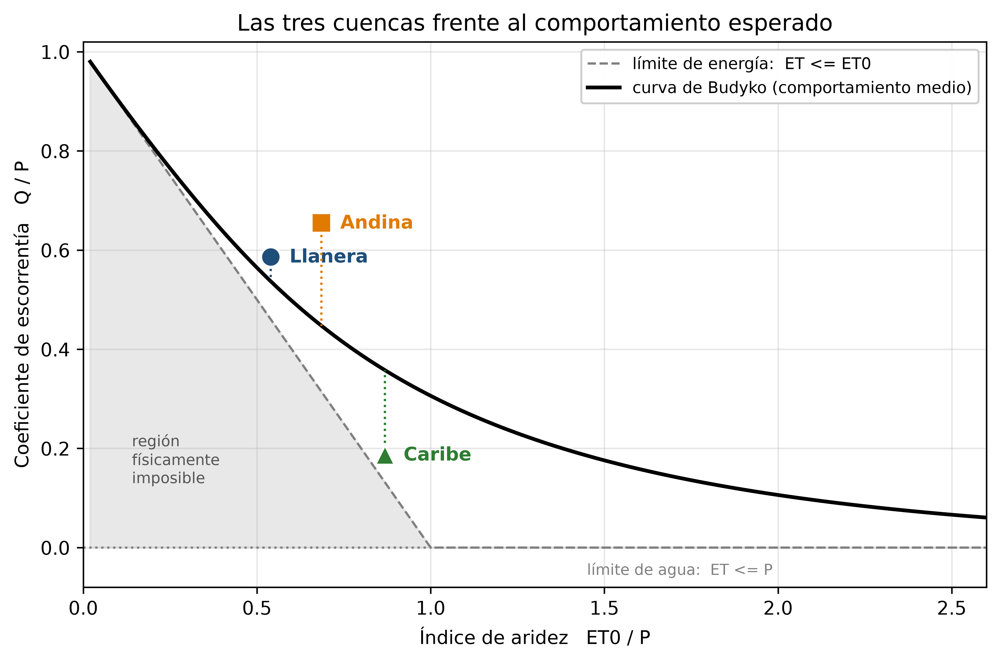

In [56]:
# Las tres cuencas sobre la curva de Budyko
phi = np.linspace(0.02, 3.0, 400)

fig, ax = plt.subplots(figsize=(7.5, 5))

# Región físicamente imposible: por debajo del límite de energía (exigiría ET > ET0)
ax.fill_between(phi, 0, np.clip(1 - phi, 0, 1), color="#d9d9d9", alpha=0.6, zorder=0)
ax.plot(phi, np.clip(1 - phi, 0, 1), color="grey", ls="--", lw=1.2,
        label="límite de energía:  ET <= ET0")
ax.axhline(0, color="grey", ls=":", lw=1.2)
ax.plot(phi, budyko_C(phi), color="k", lw=2.0, label="curva de Budyko (comportamiento medio)")

ax.text(0.14, 0.13, "región\nfísicamente\nimposible", fontsize=8, color="#555555")
ax.text(1.45, -0.055, "límite de agua:  ET <= P", fontsize=8, color="grey")

marcas = {"Llanera (Meta, 35127020)": ("o", "#1f4e79"),
          "Andina (Tolima, 21167080)": ("s", "#e07b00"),
          "Caribe (Cesar, 28037030)": ("^", "#2e7d32")}
for f in filas:
    m, c = marcas[f["cuenca"]]
    ax.scatter(f["aridez ET0/P"], f["C observado"], s=110, marker=m, color=c,
               edgecolor="white", linewidth=1.2, zorder=5)
    ax.annotate(f["cuenca"].split(" (")[0], (f["aridez ET0/P"], f["C observado"]),
                xytext=(10, -3), textcoords="offset points", fontsize=10, color=c, weight="bold")
    # segmento vertical hasta la curva: la distancia que hay que explicar
    ax.plot([f["aridez ET0/P"]] * 2, [f["C observado"], budyko_C(f["aridez ET0/P"])],
            color=c, ls=":", lw=1.2, zorder=4)

ax.set_xlabel("Índice de aridez   ET0 / P")
ax.set_ylabel("Coeficiente de escorrentía   Q / P")
ax.set_xlim(0, 2.6); ax.set_ylim(-0.08, 1.02)
ax.set_title("Las tres cuencas frente al comportamiento esperado")
ax.legend(fontsize=8.5, loc="upper right", framealpha=0.95)
plt.tight_layout(); plt.show()

**Qué dicen la tabla y la figura.**

Empiece por la columna `residuo / ET0`. En la cuenca del **Caribe** su valor es alrededor de **0.94**, de modo que el
residuo del balance implicaría que esa cuenca evapora el 94 % de todo lo que la atmósfera le demanda a
lo largo del año. En una cuenca con cuatro meses de menos de 35 mm/mes esa cifra es difícil de
sostener, porque durante esos meses la disponibilidad de agua, y no la demanda, es la que limita la
evapotranspiración. La lectura correcta no es "esta cuenca evapora
muchísimo", sino **"este residuo está absorbiendo algo que no es evapotranspiración"**. Compare con la
llanera (0.77) y la andina (0.50), que son valores más plausibles.

Y ahora la figura:

- **Llanera** cae prácticamente sobre la curva. Las tres series (lluvia, demanda atmosférica y caudal)
  son mutuamente coherentes. Es el conjunto de datos internamente consistente de los tres.
- **Andina** queda por **encima**. El río entrega más agua de la que su lluvia registrada puede
  justificar. Dado que la cuenca no puede generar agua, la explicación más probable es que CHIRPS
  subestime la precipitación real. Es un producto satelital calibrado con estaciones, y su desempeño se degrada en
  topografía compleja, donde la lluvia cambia mucho en pocos kilómetros.
- **Caribe** queda muy por **debajo**, con un caudal cercano a la mitad de lo esperado. Sumado al
  `residuo / ET0` de 0.94, la lectura es que una parte del agua **no llega al aforo**. Queda entonces
  la parte difícil, que consiste en proponer por dónde se va y descartar lo que se pueda descartar.

Hay dos candidatos, y conviene tratarlos como hipótesis y no como conclusiones:

1. **Captaciones aguas arriba.** La cobertura agropecuaria ocupa cerca del 32 % de la cuenca. Esa
   cifra por sí sola no explica nada, porque la cuenca andina tiene una fracción comparable, del 36 %,
   y no presenta déficit. Lo que distingue al Cesar es el contexto climático en que ocurre esa
   agricultura. Con un índice de aridez de 0.87, el más alto de las tres, y cuatro meses de menos de
   35 mm/mes, la producción agrícola en ese valle depende del riego, y el riego es una extracción neta
   que no retorna al cauce. Es un término sistemático, del signo correcto y de un orden de magnitud
   plausible. Confirmarlo exige el registro de concesiones de la autoridad ambiental, que no está en
   estos archivos.
2. **Flujo subterráneo hacia cuencas vecinas.** Bouaziz et al. (2018) documentan que ese término puede
   llegar al 10 % de la precipitación anual en promedio, y hasta el 25 %, y es invisible para cualquier
   balance superficial. No lo podemos descartar con los datos que tenemos.

Ninguno de los tres diagnósticos anteriores, uno por cuenca, salió de correr un modelo. **Los tres
salieron de contrastar los datos con una curva empírica, un límite físico y el conocimiento del
territorio**, que es lo que pide la caja *evaluar datos y necesidades de datos* antes de seguir
adelante.

> **Una advertencia sobre el método, no sobre las cuencas.** Todo lo anterior descansa en el supuesto de
> cierre. El enunciado defendible no es "a esta cuenca le falta la mitad del agua", sino que *el conjunto
> formado por la lluvia estimada, el caudal aforado y el supuesto de cierre es internamente incoherente*.
> Cuál de los tres es el que falla no lo resuelve el balance, lo resuelve ir a campo. Por eso el
> Ejercicio 6c le pide priorizar una campaña de medición y no un recalibrado.

## 6.4 Correr HYMOD en las tres cuencas

Estos parámetros salieron de una calibración automática sobre 2002–2005 (con 2001 como calentamiento),
usando la ET0 recalculada y **sin ningún factor de ajuste libre**. El período 2006–2008 no se usó para
calibrar.

Conviene advertir que el rango de búsqueda empleado aquí no es el mismo de la Parte 5. Las cuencas
colombianas son dos y tres órdenes de magnitud más grandes que la cuenca de ejemplo, de modo que la
búsqueda se hizo sobre $c_{max} \in [1, 1500]$ mm y no sobre $[1, 500]$ mm, mientras que los cuatro
rangos restantes se conservaron. Ese cambio tiene consecuencias que se discuten al final de esta misma
sección, cuando miremos los parámetros que resultaron.

In [57]:
PAR_COL = {
    "Llanera (Meta, 35127020)":  dict(cmax=365.21, b=0.231, alpha=0.390, Ks=0.0340, Kq=0.297),
    "Andina (Tolima, 21167080)": dict(cmax=58.73,  b=0.716, alpha=0.366, Ks=0.0510, Kq=0.980),
    "Caribe (Cesar, 28037030)":  dict(cmax=946.14, b=0.131, alpha=0.432, Ks=0.0010, Kq=0.393),
}

CAL_COL = slice("2002-01-01", "2005-12-31")
ACE_COL = slice("2006-01-01", "2008-12-31")

resultados = {}
for nombre, d in col.items():
    d["Q_sim"] = hymod(d["P_mm"].values, d["ET0_mm"].values, **PAR_COL[nombre])
    k, r_, beta, gamma = kge(d.loc[ACE_COL, "Q_mm"], d.loc[ACE_COL, "Q_sim"], componentes=True)
    resultados[nombre] = {
        "NSE cal (diario)":  nse(d.loc[CAL_COL, "Q_mm"], d.loc[CAL_COL, "Q_sim"]),
        "NSE ace (diario)":  nse(d.loc[ACE_COL, "Q_mm"], d.loc[ACE_COL, "Q_sim"]),
        "NSE ace (mensual)": nse(d.loc[ACE_COL, "Q_mm"].resample("MS").mean(),
                                 d.loc[ACE_COL, "Q_sim"].resample("MS").mean()),
        "KGE ace":           k,
        "r":                 r_,
        "beta (volumen)":    beta,
        "gamma (variabilid.)": gamma,
        "PBIAS ace (%)":     pbias(d.loc[ACE_COL, "Q_mm"], d.loc[ACE_COL, "Q_sim"]),
        "CV observado":      d.loc[ACE_COL, "Q_mm"].std() / d.loc[ACE_COL, "Q_mm"].mean(),
    }
pd.DataFrame(resultados).T.round(3)

,NSE cal (diario),NSE ace (diario),NSE ace (mensual),KGE ace,r,beta (volumen),gamma (variabilid.),PBIAS ace (%),CV observado
"Llanera (Meta, 35127020)",0.809,0.832,0.939,0.860,0.915,0.957,0.897,-4.260,0.863
"Andina (Tolima, 21167080)",0.404,0.278,0.781,0.583,0.599,0.889,0.973,-11.080,1.109
"Caribe (Cesar, 28037030)",0.651,0.429,0.492,0.373,0.684,1.256,0.523,25.629,1.318


**Antes de mirar los hidrogramas, compare las dos primeras columnas de métricas con calma.**

Por NSE, la cuenca del **Caribe (0.43)** parece mejor modelada que la **andina (0.28)**. Por KGE el
orden se invierte, con **0.37 contra 0.58**, y el Caribe queda de último. Cuando dos funciones objetivo
razonables producen órdenes opuestos, el criterio para decidir cuál sospechar no es la preferencia del
analista sino cuál de las dos tiene un defecto documentado en esa situación.

El NSE compara el modelo contra **la media de lo observado**, de modo que su denominador es la varianza
de la serie. Obsérvese la última columna. El coeficiente de variación del Caribe vale **1.32**, el más
alto de los tres, porque esa cuenca pasa cuatro meses cerca de cero y luego sube a 6 mm/día. El NSE es
una medida de habilidad relativa a ese referente, y el referente es más fácil de superar cuanto más
variable sea la serie observada. La consecuencia, ya señalada por Schaefli y Gupta (2007), es que
**el NSE no es comparable entre cuencas cuya variabilidad observada difiere**, porque el mismo valor
numérico corresponde a exigencias distintas. Comparar el 0.43 del Caribe con el 0.28 de la andina, sin
más, no tiene sentido.

El KGE no comparte ese defecto, porque separa los tres errores en lugar de agregarlos, y aquí localiza
el problema.

- `gamma = 0.52`, es decir, el coeficiente de variación simulado es la mitad del observado. Como
  $\gamma$ es una razón de coeficientes de variación y $\beta$ vale 1.26, la razón de desviaciones
  estándar resulta $\gamma\beta = 0.66$.
- `beta = 1.26`, es decir, el modelo sobreestima además el volumen en un 26 %.

En conjunto, ambos componentes indican que el modelo **aplanó la señal**, que es lo que se observa en
el hidrograma de la celda siguiente. De ahí se sigue una recomendación general. *Un NSE alto en una
cuenca muy estacional aporta poca información sobre la calidad del modelo. Conviene pedir siempre el
KGE descompuesto, o comparar contra un referente más exigente que la media, como la climatología del
propio río.*

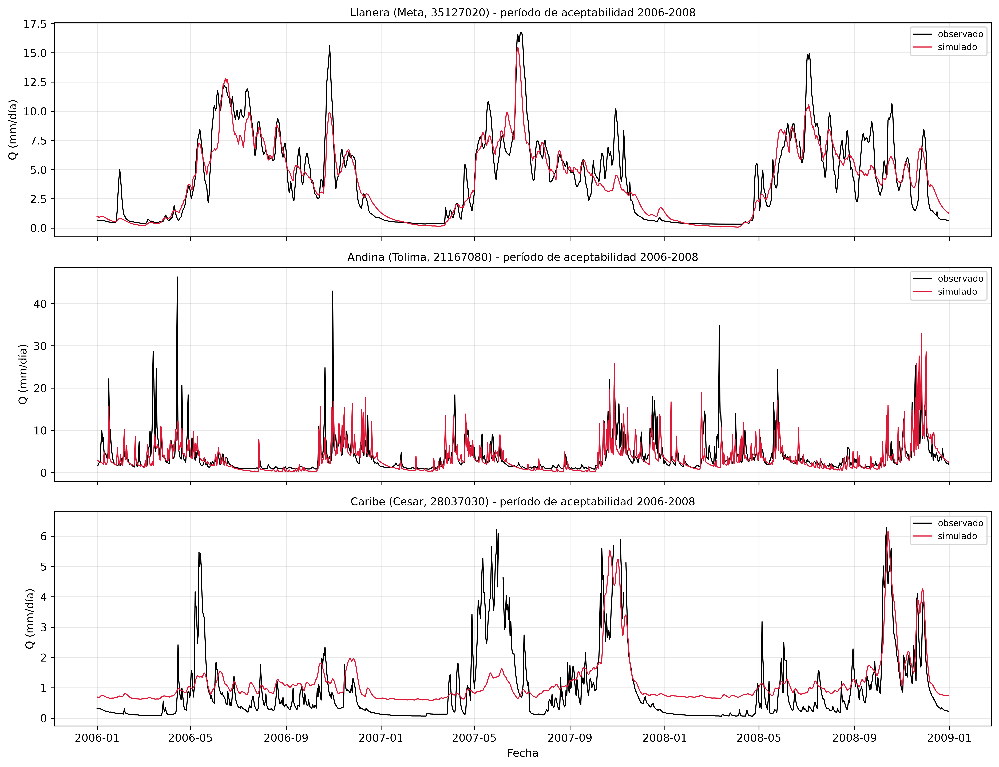

In [58]:
fig, axs = plt.subplots(3, 1, figsize=(13, 10), sharex=True)
for ax, (nombre, d) in zip(axs, col.items()):
    v = d.loc[ACE_COL]
    ax.plot(v.index, v["Q_mm"],  color="k", lw=1.0, label="observado")
    ax.plot(v.index, v["Q_sim"], color="#de1937", lw=1.0, label="simulado")
    ax.set_ylabel("Q (mm/día)")
    ax.set_title(f"{nombre} - período de aceptabilidad 2006-2008", fontsize=10)
    ax.legend(fontsize=8)
axs[-1].set_xlabel("Fecha")
plt.tight_layout(); plt.show()

**Una última mirada a los parámetros calibrados**, tan informativa como el NSE. La columna
$S_{max} = c_{max}/(b+1)$ es la capacidad de almacenamiento promediada sobre la cuenca que el modelo
necesita para reproducir el caudal observado.

| | `cmax` | `b` | `alpha` | `Ks` | `Kq` | $S_{max}$ |
|---|---|---|---|---|---|---|
| Llanera | 365 | 0.23 | 0.39 | 0.034 | 0.30 | 297 mm |
| Andina | 59 | 0.72 | 0.37 | 0.051 | 0.98 | 34 mm |
| Caribe | 946 | 0.13 | 0.43 | **0.001** ⚠ | 0.39 | **837 mm** ⚠ |

En la cuenca del Caribe la calibración exige un almacenamiento de 837 mm y empuja `Ks` contra el
**piso** de su rango, es decir, un embalse lento que prácticamente no descarga. Esa es la causa
mecánica del aplanamiento que identificó el KGE. Con `Ks` tan bajo el agua queda retenida y sale como
una descarga casi constante, que sostiene un flujo base inexistente durante la estación seca y no queda
disponible para los picos.

Cuando un parámetro calibrado se pega al borde de su rango, rara vez significa que haya que ampliar el
rango. Con más frecuencia significa que el modelo está compensando, con un valor no identificable, algo
que ocurre **fuera** del modelo. La hipótesis más simple aquí es el agua que se extrae aguas arriba, un
término que HYMOD no representa.

Compare con la cuenca andina, con 34 mm de almacenamiento, un valor compatible con un suelo de ladera
delgado. Los parámetros de un modelo conceptual no se miden en campo, pero cuando toman valores que el
clima de la cuenca no puede sostener están informando algo sobre el conjunto de datos.

---
## ✏️ Ejercicio 6: Cierre

**6a.** La cuenca que cae sobre la curva de Budyko es también la que el modelo reproduce mejor. Ponga
esa observación a prueba antes de creérsela:

1. Ordene las tres cuencas por su desviación respecto de la curva usando la **diferencia**
   $|C_{obs} - C_{esperado}|$, y después usando la **razón** $C_{obs}/C_{esperado}$. ¿Sale el mismo
   orden?
2. Compare cada orden con el de `NSE ace (diario)`.
3. Con tres cuencas, ¿qué puede afirmar y qué no puede afirmar? Escriba una frase que sea defendible
   ante alguien que le pregunte "¿y eso con cuántos casos lo comprobó?".

> ✏️ *(Por diferencia (|C_{obs}-C_{esperado}|), el orden de cercanía a Budyko es Llanera (0.049) luego Caribe (0.171) luego Andina (0.207). Si se utiliza la razón (C_{obs}/C_{esperado}) y se mide la distancia respecto al valor ideal 1, el orden cambia a Llanera (1.092) luego Andina (1.463) y luego a Caribe (0.522). Por tanto, los dos criterios no producen exactamente el mismo orden. Al comparar con el NSE de evaluación diario, el orden según la diferencia absoluta coincide con el desempeño del modelo: Llanera (0.832) luego Caribe (0.429) y al final Andina (0.278). Sin embargo, con solo tres cuencas no se puede establecer una relación general ni decir que ya es una causal entre cercanía a Budyko y desempeño del modelo. Lo que puede afirmarse es que, en este conjunto de tres casos, existe una asociación consistente entre ambas variables cuando se utiliza la desviación absoluta.)*

**6b.** En la cuenca andina el `NSE ace (diario)` es bajo, pero el `NSE ace (mensual)` es alto.
Relacione ese contraste con la diapositiva del protocolo que ordena la evaluación así: *(1) volumen
anual, (2) volúmenes estacionales, (3) caudales semanales y diarios, (4) hidrogramas de creciente*, con
**énfasis inicial en 1 y 2**. ¿Por qué ese orden y no el contrario?

> ✏️ *(El contraste entre el NSE diario (0.278) y el NSE mensual (0.781) muestra que el modelo representa bien el comportamiento agregado de la cuenca Andina, pero tiene dificultades para reproducir la dinámica de corto plazo (los periodos diarios). Por ello, el protocolo prioriza primero el volumen anual y los volúmenes estacionales: antes de evaluar detalles diarios o eventos de creciente, es necesario verificar que el modelo conserve correctamente el balance hídrico y reproduzca la distribución temporal general del agua. Si se empezara por los caudales diarios, se podría intentar ajustar la respuesta rápida del modelo. El orden de evaluación iria, de las propiedades más fundamentales y robustas del balance hacia las respuestas temporales más específicas.)*

**6c.** Usted debe entregar un estudio de disponibilidad hídrica para la cuenca del **Cesar**. Con lo
que vio hoy, escriba tres líneas dirigidas al cliente: qué le puede garantizar del modelo, qué no, y qué
dato conseguiría primero si tuviera presupuesto para una sola campaña de campo.

> ✏️ *(El modelo permite representar adecuadamente la dinámica general del caudal y constituye una herramienta útil para estimar la disponibilidad hídrica del Cesar. Sin embargo, antes de garantizar los volúmenes disponibles con alta confianza, es necesario validar las discrepancias identificadas en el balance. Priorizaría una campaña de aforos y medición de captaciones aguas arriba, que permita fortalecer la información y mejorar la confiabilidad de las estimaciones.)*

In [59]:
tabla_budyko = pd.DataFrame(filas).set_index("cuenca")

tabla_budyko["desviación absoluta"] = (
    tabla_budyko["C observado"] -
    tabla_budyko["C esperado (Budyko)"]
).abs()

tabla_budyko["razón Cobs/Cesperado"] = (
    tabla_budyko["C observado"] /
    tabla_budyko["C esperado (Budyko)"]
)

tabla_budyko[
    [
        "C observado",
        "C esperado (Budyko)",
        "desviación absoluta",
        "razón Cobs/Cesperado"
    ]
].round(3)

,C observado,C esperado (Budyko),desviación absoluta,razón Cobs/Cesperado
cuenca,,,,
"Llanera (Meta, 35127020)",0.586,0.537,0.049,1.092
"Andina (Tolima, 21167080)",0.655,0.447,0.207,1.463
"Caribe (Cesar, 28037030)",0.187,0.358,0.171,0.522


In [60]:
print("Orden por desviación absoluta:")
display(
    tabla_budyko.sort_values("desviación absoluta")[
        ["C observado", "C esperado (Budyko)", "desviación absoluta"]
    ].round(3)
)

print("\nOrden por razón Cobs/Cesperado:")
display(
    tabla_budyko.sort_values("razón Cobs/Cesperado")[
        ["C observado", "C esperado (Budyko)", "razón Cobs/Cesperado"]
    ].round(3)
)

Orden por desviación absoluta:


,C observado,C esperado (Budyko),desviación absoluta
cuenca,,,
"Llanera (Meta, 35127020)",0.586,0.537,0.049
"Caribe (Cesar, 28037030)",0.187,0.358,0.171
"Andina (Tolima, 21167080)",0.655,0.447,0.207



Orden por razón Cobs/Cesperado:


,C observado,C esperado (Budyko),razón Cobs/Cesperado
cuenca,,,
"Caribe (Cesar, 28037030)",0.187,0.358,0.522
"Llanera (Meta, 35127020)",0.586,0.537,1.092
"Andina (Tolima, 21167080)",0.655,0.447,1.463


---
# Entrega

Guarde el cuaderno (`Ctrl + S`), **reinicie el kernel y córralo completo de arriba a abajo** para
verificar que no queda ningún error (`Run All`). Después, desde la terminal de VS Code, en la carpeta
del repositorio:

```bash
conda activate hidro
git status                      # revise que solo aparezca lo que quiere subir
git add notebooks/ resultados/
git commit -m "Taller 1 resuelto"
git push
```

Si es la primera vez que sube este repositorio, siga las instrucciones del `README.md`.

**Lista de verificación antes de entregar:**

- [ ] El cuaderno corre completo sin errores, con el kernel reiniciado.
- [ ] Las seis celdas ✏️ de código están completas (Ejercicios 1a, 2 y los cuatro intentos de 5a).
- [ ] Las diez respuestas escritas ✏️ están redactadas (1b, 3a, 3b, 4a, 4b, 4c, 5b, 6a, 6b, 6c).
- [ ] La bitácora de calibración tiene al menos siete intentos con su nota correspondiente.
- [ ] El repositorio **no** incluye la carpeta `datos/` con archivos pesados que no sean los del taller.
- [ ] El repositorio es público, o privado con el profesor agregado como colaborador.

---

### Fuentes de los datos

- **Cuenca de ejemplo (Partes 2 a 5):** conjunto `hymod_input.csv` distribuido con SPOTPY.
  Houska, T., Kraft, P., Chamorro-Chavez, A. & Breuer, L. (2015). *SPOTting Model Parameters Using a
  Ready-Made Python Package.* PLoS ONE 10(12): e0145180.
- **Cuencas colombianas (Parte 6):** Jiménez, D. A. et al. (2025). *CAMELS-COL: A Large-Sample
  Hydrometeorological Dataset for Colombia.* Earth System Science Data (en revisión).
  Datos bajo licencia CC-BY 4.0, disponibles en Zenodo: https://zenodo.org/records/18794895
- **Modelo HYMOD:** Boyle (2001); Wagener et al. (2001). Implementación adaptada de la versión en
  Python incluida en SPOTPY.
- **Balance hídrico y supuesto de cierre:** Dingman, S. L. (2015). *Physical Hydrology*, 3.ª ed.
  Senay, G. B. et al. (2011). *Estimating basin scale evapotranspiration (ET) by water balance and
  remote sensing methods.* Hydrological Processes, 25(26), 4037–4049.
- **Flujo subterráneo entre cuencas:** Bouaziz, L. et al. (2018). *Redressing the balance: quantifying
  net intercatchment groundwater flows.* Hydrology and Earth System Sciences, 22, 6415–6434.
- **Marco de Budyko:** Budyko, M. I. (1974). *Climate and Life.* Academic Press.
- **Funciones objetivo.** Nash, J. E. & Sutcliffe, J. V. (1970). *River flow forecasting through
  conceptual models part I.* Journal of Hydrology, 10(3), 282–290. Gupta, H. V., Kling, H., Yilmaz,
  K. K. & Martinez, G. F. (2009). *Decomposition of the mean squared error and NSE performance
  criteria.* Journal of Hydrology, 377(1–2), 80–91.
- **Límites de interpretación del NSE y del KGE.** Schaefli, B. & Gupta, H. V. (2007). *Do Nash values
  have value?* Hydrological Processes, 21(15), 2075–2080. Knoben, W. J. M., Freer, J. E. & Woods, R. A.
  (2019). *Technical note: Inherent benchmark or not? Comparing Nash-Sutcliffe and Kling-Gupta
  efficiency scores.* Hydrology and Earth System Sciences, 23, 4323–4331.
- **Función de distribución de almacenamiento (bloque 1 de HYMOD).** Moore, R. J. (1985). *The
  probability-distributed principle and runoff production at point and basin scales.* Hydrological
  Sciences Journal, 30(2), 273–297.
- **Almacenamiento en la zona radicular a partir del déficit climático acumulado.** Gao, H.,
  Hrachowitz, M., Schymanski, S. J., Fenicia, F., Sriwongsitanon, N. & Savenije, H. H. G. (2014).
  *Climate controls how ecosystems size their root zone storage capacity at catchment scale.*
  Geophysical Research Letters, 41(22), 7916–7923.
- **Equifinalidad.** Beven, K. & Freer, J. (2001). *Equifinality, data assimilation, and uncertainty
  estimation in mechanistic modelling of complex environmental systems.* Journal of Hydrology,
  249(1–4), 11–29.
- **Evapotranspiración de referencia:** Hargreaves, G. H. & Samani, Z. A. (1985). *Reference crop
  evapotranspiration from temperature.* Applied Engineering in Agriculture, 1(2), 96–99.
  Allen, R. G. et al. (1998). *Crop evapotranspiration.* FAO Irrigation and Drainage Paper 56
  (ecuaciones 21 a 25 para la radiación extraterrestre).